# Project: Analysis and Selection of Dairy Cows Using Linear Machine Learning Models

**Project goal: Help a farmer select cows for purchase based on milk yield and milk taste, and develop machine learning models for this task.**

**Data description:**
1. **ferma_main.csv - contains data about the farmer's herd at the current moment**
    * id — unique cow identifier.
    * Yield, kg — annual milk yield (in kilograms).
    * Fodder unit — nutritional value of the cow's feed.
    * Raw protein, g — raw protein content in the feed (in grams).
    * SPR (Sugar-protein ratio) — ratio of sugar to protein in the cow's feed.
    * Breed — cow breed.
    * Pasture type — landscape of the meadows where the cow grazed.
    * Dad's breed — breed of the cow's father.
    * Fat content, % — fat content in milk (in percent).
    * Protein content, % — protein content in milk (in percent).
    * Milk taste — taste rating by the farmer, binary feature (tasty, not tasty).
    * Age — cow's age, binary feature (less_than_2_years, more_than_2_years). 
    
    
2. **ferma_dad.csv - stores the name of the father of each cow in the herd**
    * id — unique cow identifier.
    * Dad's name — name of the cow's father.
    
    
3. **cow_buy.csv - data about cows from "EcoFarm" that the farmer wants to study before buying**
    * Breed — cow breed.
    * Pasture type — landscape of the meadows where the cow grazed.
    * Dad's breed — breed of the cow's father.
    * Dad's name — name of the cow's father.
    * Current fat content, % — fat content in milk (in percent).
    * Current protein content, % — protein content in milk (in percent).
    * Age — cow's age, binary feature (less_than_2_years, more_than_2_years).

<!-- removed colored markdown -->

In [1]:
pip install -r requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import phik

from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from scipy import stats as st
from sklearn.metrics import (
    accuracy_score, 
    confusion_matrix, 
    r2_score,
    precision_score,
    recall_score,
    mean_squared_error,
    mean_absolute_error
)

RANDOM_STATE = 44

plt.rcParams['figure.max_open_warning'] = 0

<!-- removed colored markdown -->

Fixed

<!-- removed colored markdown -->

## Data loading

In [3]:
df_main = pd.read_csv("ferma_main.csv", sep=';', decimal=',')
df_main.head()

,id,"Удой, кг",ЭКЕ (Энергетическая кормовая единица),"Сырой протеин, г",СПО (Сахаро-протеиновое соотношение),Порода,Тип пастбища,порода папы_быка,"Жирность,%","Белок,%",Вкус молока,Возраст
0,1,5863,14.2,1743,0.890,Вис Бик Айдиал,Равнинное,Айдиал,3.58,3.076,вкусно,более_2_лет
1,2,5529,12.8,2138,0.890,Вис Бик Айдиал,Равнинные,Соверин,3.54,3.079,вкусно,менее_2_лет
2,3,5810,14.0,1854,0.885,РефлешнСоверинг,Холмистое,Соверин,3.59,3.074,не вкусно,более_2_лет
3,4,5895,12.4,2012,0.885,РефлешнСоверинг,Холмистое,Айдиал,3.40,3.075,не вкусно,более_2_лет
4,5,5302,12.8,1675,0.885,Вис Бик Айдиал,Равнинные,Соверин,3.73,3.073,вкусно,менее_2_лет


<!-- removed colored markdown -->

In [4]:
df_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 634 entries, 0 to 633
Data columns (total 12 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     634 non-null    int64  
 1   Удой, кг                               634 non-null    int64  
 2   ЭКЕ (Энергетическая кормовая единица)  634 non-null    float64
 3   Сырой протеин, г                       634 non-null    int64  
 4   СПО (Сахаро-протеиновое соотношение)   634 non-null    float64
 5   Порода                                 634 non-null    object 
 6   Тип пастбища                           634 non-null    object 
 7   порода папы_быка                       634 non-null    object 
 8   Жирность,%                             634 non-null    float64
 9   Белок,%                                634 non-null    float64
 10  Вкус молока                            634 non-null    object 
 11  Возрас

In [5]:
df_main.isna().any()

id                                       False
Удой, кг                                 False
ЭКЕ (Энергетическая кормовая единица)    False
Сырой протеин, г                         False
СПО (Сахаро-протеиновое соотношение)     False
Порода                                   False
Тип пастбища                             False
порода папы_быка                         False
Жирность,%                               False
Белок,%                                  False
Вкус молока                              False
Возраст                                  False
dtype: bool

**Quantitative features SPR, Fat content, Protein content were initially of string type Object due to comma as decimal separator. No missing values at this stage. Column names have different cases and styles, need processing. Total 634 objects.**

**Let's rename columns as follows:**
* Yield -> yield
* Fodder unit -> fodder_unit
* Raw protein -> raw_protein
* SPR -> spr (sugar-protein ratio)
* Breed -> breed
* Pasture type -> pasture_type
* Dad's breed -> dads_breed
* Fat content -> fat_content
* Protein content -> protein_content
* Milk taste -> milk_taste
* Age -> age

In [6]:
df_main = df_main.rename(columns={
    'Удой, кг': 'yield',
    'ЭКЕ (Энергетическая кормовая единица)': 'fodder_unit',
    'Сырой протеин, г': 'raw_protein',
    'СПО (Сахаро-протеиновое соотношение)': 'spr',
    'Порода': 'breed',
    'Тип пастбища': 'pasture_type',
    'порода папы_быка': 'dads_breed',
    'Жирность,%': 'fat_content',
    'Белок,%': 'protein_content',
    'Вкус молока': 'milk_taste',
    'Возраст': 'age'
})

<!-- removed colored markdown -->

In [7]:
df_main.columns

Index(['id', 'yield', 'fodder_unit', 'raw_protein', 'spr', 'breed',
       'pasture_type', 'dads_breed', 'fat_content', 'protein_content',
       'milk_taste', 'age'],
      dtype='object')

In [8]:
df_dad = pd.read_csv('ferma_dad.csv', sep=';')
df_dad.head()

,id,Имя Папы
0,1,Буйный
1,2,Соловчик
2,3,Барин
3,4,Буйный
4,5,Барин


In [9]:
df_dad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 629 entries, 0 to 628
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        629 non-null    int64 
 1   Имя Папы  629 non-null    object
dtypes: int64(1), object(1)
memory usage: 10.0+ KB


**No missing values, data types are fine. However, there are fewer objects (629) compared to df_main, probably due to duplicates in the latter.**

**Let's rename columns as follows:**
* Dad's name -> dads_name

In [10]:
df_dad.columns = ['id', 'dads_name']

In [11]:
df_dad.columns

Index(['id', 'dads_name'], dtype='object')

In [12]:
df_buy = pd.read_csv('cow_buy.csv', sep=';', decimal=',')
df_buy.head()

,Порода,Тип пастбища,порода папы_быка,Имя_папы,"Текущая_жирность,%","Текущий_уровень_белок,%",Возраст
0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,3.58,3.076,более_2_лет
1,Вис Бик Айдиал,равнинное,Соверин,Буйный,3.54,3.081,менее_2_лет
2,РефлешнСоверинг,равнинное,Соверин,Барин,3.59,3.074,более_2_лет
3,РефлешнСоверинг,холмистое,Айдиал,Буйный,3.40,3.061,более_2_лет
4,РефлешнСоверинг,равнинное,Айдиал,Буйный,3.64,3.074,более_2_лет


In [13]:
df_buy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Порода                   20 non-null     object 
 1   Тип пастбища             20 non-null     object 
 2   порода папы_быка         20 non-null     object 
 3   Имя_папы                 20 non-null     object 
 4   Текущая_жирность,%       20 non-null     float64
 5   Текущий_уровень_белок,%  20 non-null     float64
 6   Возраст                  20 non-null     object 
dtypes: float64(2), object(5)
memory usage: 1.2+ KB


**No missing values, quantitative features are numeric, column names should be unified.**

**Let's rename columns as follows:**
* Breed -> breed
* Pasture type -> pasture_type
* Dad's breed -> dads_breed
* Dad's name -> dads_name
* Current fat content -> fat_content
* Current protein content -> protein_content
* Age -> age

In [14]:
df_buy = df_buy.rename(columns={
    'Порода': 'breed',
    'Тип пастбища': 'pasture_type',
    'порода папы_быка': 'dads_breed',
    'Имя_папы': 'dads_name',
    'Текущая_жирность,%': 'fat_content',
    'Текущий_уровень_белок,%': 'protein_content',
    'Возраст': 'age'
})

In [15]:
df_buy.columns

Index(['breed', 'pasture_type', 'dads_breed', 'dads_name', 'fat_content',
       'protein_content', 'age'],
      dtype='object')

## Data preprocessing

**First, let's look at unique values of categorical features for typos and missing values in quantitative features, and change data types to numeric where necessary.**

<!-- removed colored markdown -->

No string NA values found, text above corrected.

<!-- removed colored markdown -->

### **df_main**

#### breed

In [16]:
df_main['breed'].unique()

array(['Вис Бик Айдиал', 'РефлешнСоверинг'], dtype=object)

**No typos found, for convenience, keep only the last word in breed names: replace "ReflectionSovering" with "Sovering", and "Vis Bik Ideal" with "Ideal".**

In [17]:
df_main['breed'].replace(to_replace='РефлешнСоверинг', value='Соверинг', inplace=True)
df_main['breed'].replace(to_replace='Вис Бик Айдиал', value='Айдиал', inplace=True)

C:\Users\datre\AppData\Local\Temp\ipykernel_15396\3911112113.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_main['breed'].replace(to_replace='РефлешнСоверинг', value='Соверинг', inplace=True)
C:\Users\datre\AppData\Local\Temp\ipykernel_15396\3911112113.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting val

In [18]:
df_main['breed'].unique()

array(['Айдиал', 'Соверинг'], dtype=object)

#### pasture_type

In [19]:
df_main['pasture_type'].unique()

array(['Равнинное', 'Равнинные', 'Холмистое'], dtype=object)

**"Plain" and "Plains" are the same, keep only the first and convert to lowercase.**

In [20]:
df_main['pasture_type'].replace(to_replace='Равнинные', value='Равнинное', inplace=True)

C:\Users\datre\AppData\Local\Temp\ipykernel_15396\3120054475.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_main['pasture_type'].replace(to_replace='Равнинные', value='Равнинное', inplace=True)


In [21]:
df_main['pasture_type'] = df_main['pasture_type'].str.lower()

In [22]:
df_main['pasture_type'].unique()

array(['равнинное', 'холмистое'], dtype=object)

#### dads_breed

In [23]:
df_main['dads_breed'].unique()

array(['Айдиал', 'Соверин', 'Айдиалл'], dtype=object)

**Typo in breed name.**

In [24]:
df_main['dads_breed'].replace(to_replace='Айдиалл', value='Айдиал', inplace=True)
df_main['dads_breed'].replace(to_replace='Соверин', value='Соверинг', inplace=True)

C:\Users\datre\AppData\Local\Temp\ipykernel_15396\694802434.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_main['dads_breed'].replace(to_replace='Айдиалл', value='Айдиал', inplace=True)
C:\Users\datre\AppData\Local\Temp\ipykernel_15396\694802434.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values alw

<!-- removed colored markdown -->

In [25]:
df_main['dads_breed'].unique()

array(['Айдиал', 'Соверинг'], dtype=object)

#### milk_taste

In [26]:
df_main['milk_taste'].unique()

array(['вкусно', 'не вкусно'], dtype=object)

**All good.**

#### age

In [27]:
df_main['age'].unique()

array(['более_2_лет', 'менее_2_лет'], dtype=object)

**All good.**

**Duplicate handling**

In [28]:
df_main.duplicated().sum() #явные дубликаты

5

**These duplicates likely explain the mismatch in entries between df_main and df_dad.**

In [29]:
df_main.drop_duplicates(inplace=True)
df_main.shape[0]

629

<!-- removed colored markdown -->

**Quantitative features are numeric and have no NA values, no further review needed here.**

### **df_dad**

#### dads_name

In [30]:
df_dad['dads_name'].unique()

array(['Буйный', 'Соловчик', 'Барин', 'Геркулес'], dtype=object)

**No typos.**

### **df_buy**

#### breed

In [31]:
df_buy['breed'].unique()

array(['Вис Бик Айдиал', 'РефлешнСоверинг'], dtype=object)

**Also replace with last word in full name for convenience.**

In [32]:
df_buy['breed'].replace(to_replace='РефлешнСоверинг', value='Соверинг', inplace=True)
df_buy['breed'].replace(to_replace='Вис Бик Айдиал', value='Айдиал', inplace=True)

C:\Users\datre\AppData\Local\Temp\ipykernel_15396\2593185139.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_buy['breed'].replace(to_replace='РефлешнСоверинг', value='Соверинг', inplace=True)
C:\Users\datre\AppData\Local\Temp\ipykernel_15396\2593185139.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting valu

In [33]:
df_buy['breed'].unique()

array(['Айдиал', 'Соверинг'], dtype=object)

#### pasture_type

In [34]:
df_buy['pasture_type'].unique()

array(['холмистое', 'равнинное'], dtype=object)

**No typos.**

#### dads_breed

In [35]:
df_buy['dads_breed'].unique()

array(['Айдиал', 'Соверин'], dtype=object)

**Add 'g' to Soverin.**

In [36]:
df_buy['dads_breed'].replace(to_replace='Соверин', value='Соверинг', inplace=True)

C:\Users\datre\AppData\Local\Temp\ipykernel_15396\790510650.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_buy['dads_breed'].replace(to_replace='Соверин', value='Соверинг', inplace=True)


#### dads_name

In [37]:
df_buy['dads_name'].unique()

array(['Геркулес', 'Буйный', 'Барин', 'Соловчик'], dtype=object)

**No typos.**

<!-- removed colored markdown -->

### Merging df_main and df_dad

**For convenience, merge dataframes by id column.**

In [38]:
df = pd.merge(df_main, df_dad, how='inner', on='id')
df.head()

,id,yield,fodder_unit,raw_protein,spr,breed,pasture_type,dads_breed,fat_content,protein_content,milk_taste,age,dads_name
0,1,5863,14.2,1743,0.890,Айдиал,равнинное,Айдиал,3.58,3.076,вкусно,более_2_лет,Буйный
1,2,5529,12.8,2138,0.890,Айдиал,равнинное,Соверинг,3.54,3.079,вкусно,менее_2_лет,Соловчик
2,3,5810,14.0,1854,0.885,Соверинг,холмистое,Соверинг,3.59,3.074,не вкусно,более_2_лет,Барин
3,4,5895,12.4,2012,0.885,Соверинг,холмистое,Айдиал,3.40,3.075,не вкусно,более_2_лет,Буйный
4,5,5302,12.8,1675,0.885,Айдиал,равнинное,Соверинг,3.73,3.073,вкусно,менее_2_лет,Барин


In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 629 entries, 0 to 628
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               629 non-null    int64  
 1   yield            629 non-null    int64  
 2   fodder_unit      629 non-null    float64
 3   raw_protein      629 non-null    int64  
 4   spr              629 non-null    float64
 5   breed            629 non-null    object 
 6   pasture_type     629 non-null    object 
 7   dads_breed       629 non-null    object 
 8   fat_content      629 non-null    float64
 9   protein_content  629 non-null    float64
 10  milk_taste       629 non-null    object 
 11  age              629 non-null    object 
 12  dads_name        629 non-null    object 
dtypes: float64(4), int64(3), object(6)
memory usage: 64.0+ KB


## Exploratory Data Analysis

**Let's start by looking at the distributions of quantitative features.**

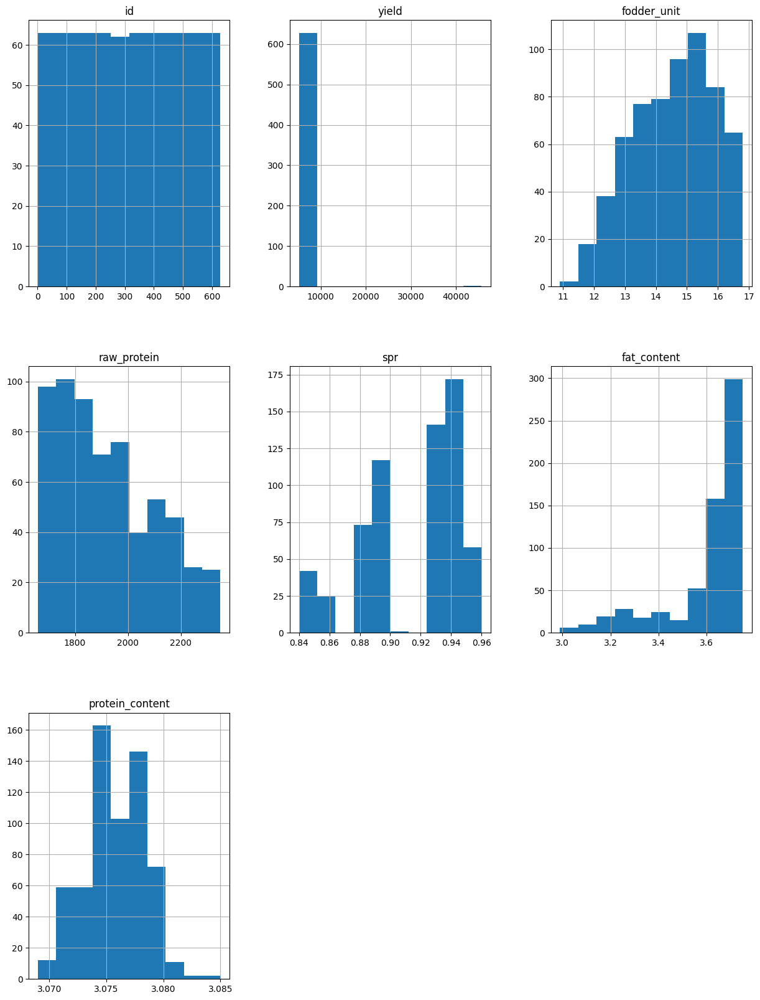

In [40]:
df.select_dtypes(include='number').hist(figsize=(15, 20))
print()

**After a preliminary review of the distributions of numerical features, we can immediately notice anomalies in the yield distribution. Let's look at it below, then plot and analyze the rest.**

<!-- removed colored markdown -->

### yield

In [41]:
df['yield'].describe()

count      629.000000
mean      6188.750397
std       1644.795489
min       5204.000000
25%       5751.000000
50%       6133.000000
75%       6501.000000
max      45616.000000
Name: yield, dtype: float64

In [42]:
df.sort_values(by='yield', ascending=False).head(5)

,id,yield,fodder_unit,raw_protein,spr,breed,pasture_type,dads_breed,fat_content,protein_content,milk_taste,age,dads_name
16,17,45616,11.5,1675,0.93,Айдиал,холмистое,Айдиал,3.22,3.076,вкусно,более_2_лет,Буйный
70,71,7222,16.8,2157,0.95,Айдиал,холмистое,Айдиал,3.70,3.076,вкусно,более_2_лет,Геркулес
135,136,7207,16.6,2343,0.94,Айдиал,холмистое,Айдиал,3.72,3.078,вкусно,более_2_лет,Буйный
296,297,7201,15.8,2077,0.94,Соверинг,холмистое,Айдиал,3.71,3.072,вкусно,более_2_лет,Буйный
294,295,7197,15.6,2241,0.94,Соверинг,холмистое,Айдиал,3.71,3.075,вкусно,более_2_лет,Буйный


**As expected, there is an abnormally large outlier in the seventeenth object, most likely a recording or rounding error. If we replace the yield value with 4562 ≈ 4561.6, we get a value much less than the minimum (5204), so we simply remove this entry.**

In [43]:
df.drop(index=16, inplace=True)

<!-- removed colored markdown -->

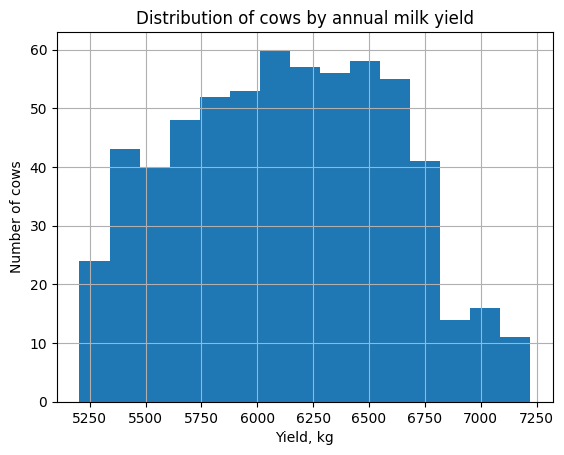

In [44]:
plt.ylabel('Number of cows')
plt.xlabel('Yield, kg')
plt.title('Distribution of cows by annual milk yield')
df['yield'].hist(bins=15)
print()

<!-- removed colored markdown -->

Removed the range restriction, since the only anomaly was removed above, the histogram appearance did not change.

<!-- removed colored markdown -->

count     628.000000
mean     6125.968153
std       475.857053
min      5204.000000
25%      5749.750000
50%      6132.500000
75%      6501.000000
max      7222.000000
Name: yield, dtype: float64

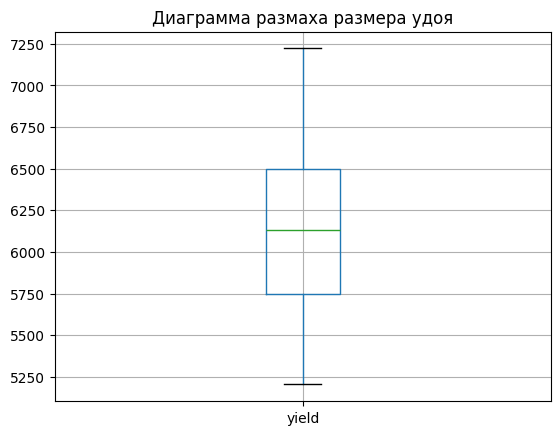

In [45]:
plt.title('Диаграмма размаха размера удоя')
df.boxplot(column='yield')
df['yield'].describe()

**The average annual milk yield is 6125 kg and almost equals the median: 6132 kg. No outliers by the 1.5 IQR rule, and the data is nearly normally distributed. Minimum yield: 5204 kg, maximum: 7222 kg.**

### fodder_unit

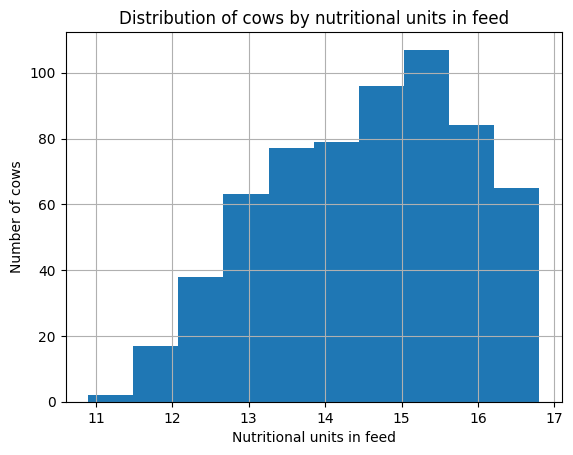

In [46]:
plt.ylabel('Number of cows')
plt.xlabel('Nutritional units in feed')
plt.title('Distribution of cows by nutritional units in feed')
df['fodder_unit'].hist(bins=10)
print()

count    628.000000
mean      14.548726
std        1.301777
min       10.900000
25%       13.500000
50%       14.700000
75%       15.600000
max       16.800000
Name: fodder_unit, dtype: float64

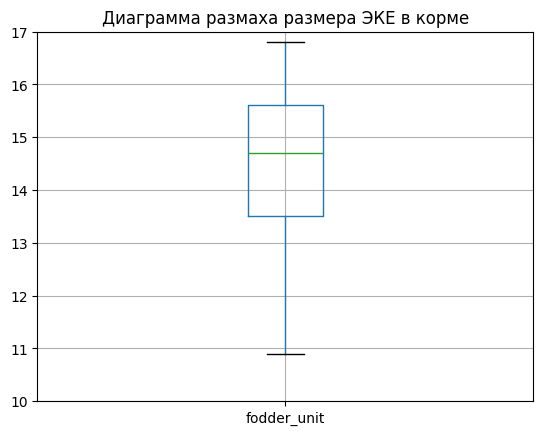

In [47]:
plt.title('Диаграмма размаха размера ЭКЕ в корме')
plt.ylim(10, 17)
df.boxplot(column='fodder_unit')
df['fodder_unit'].describe()

**The average feed nutritional value is 14.55 fodder units, median 14.7, the data is right-skewed, no outliers, min 10.9, max 16.8.**

<!-- removed colored markdown -->

### raw_protein

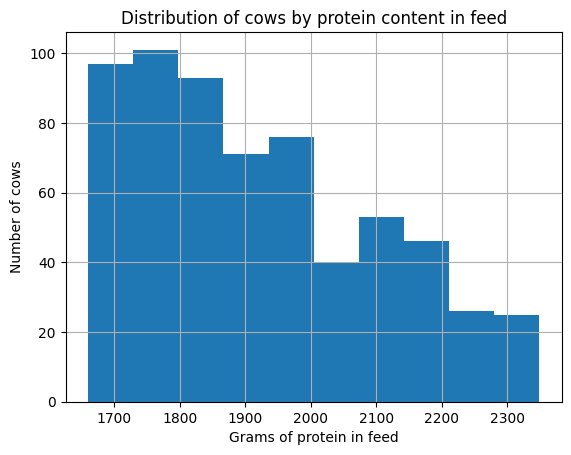

In [48]:
plt.ylabel('Number of cows')
plt.xlabel('Grams of protein in feed')
plt.title('Distribution of cows by protein content in feed')
df['raw_protein'].hist(bins=10)
print()

count     628.000000
mean     1923.759554
std       182.832816
min      1660.000000
25%      1771.750000
50%      1888.000000
75%      2062.250000
max      2349.000000
Name: raw_protein, dtype: float64

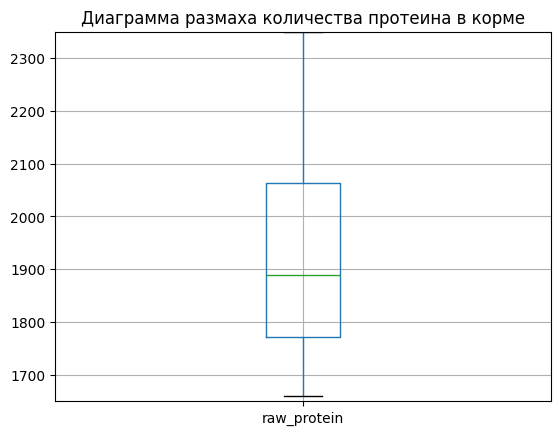

In [49]:
plt.title('Диаграмма размаха количества протеина в корме')
plt.ylim(1650, 2350)
df.boxplot(column='raw_protein')
df['raw_protein'].describe()

**No outliers, histogram peak is at lower values, mean protein in feed is 1923.75g, median 1888g (less than mean, logical for many points at lower values), min: 1660g, max: 2349g.**

### sugar-protein ratio

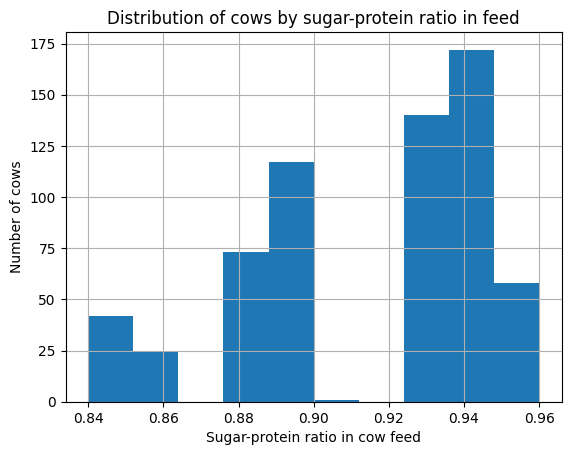

In [50]:
plt.ylabel('Number of cows')
plt.xlabel('Sugar-protein ratio in cow feed')
plt.title('Distribution of cows by sugar-protein ratio in feed')
df['spr'].hist(bins=10)
print()

**The histogram shows three SPR intervals separated by gaps; this quantitative feature can be replaced with a categorical one if needed.**

In [51]:
df['spr'].value_counts()

spr
0.940    172
0.930    140
0.890     94
0.880     58
0.950     55
0.840     25
0.860     25
0.895     23
0.850     17
0.885     15
0.960      3
0.900      1
Name: count, dtype: int64

**The feature is not discrete, but there are only 12 unique ratio values.**

count    628.000000
mean       0.913089
std        0.032221
min        0.840000
25%        0.890000
50%        0.930000
75%        0.940000
max        0.960000
Name: spr, dtype: float64

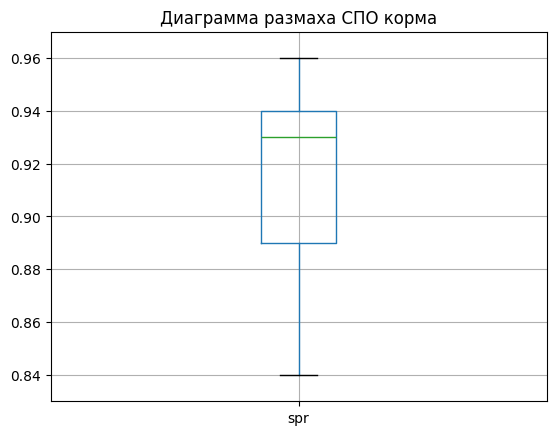

In [52]:
plt.title('Диаграмма размаха СПО корма')
plt.ylim(0.83, 0.97)
df.boxplot(column='spr')
df['spr'].describe()

**Min SPR: 0.84, max: 0.96, mean: 0.913, median: 0.93. Most common value: 0.94, rarest: 0.9.** 

### fat_content

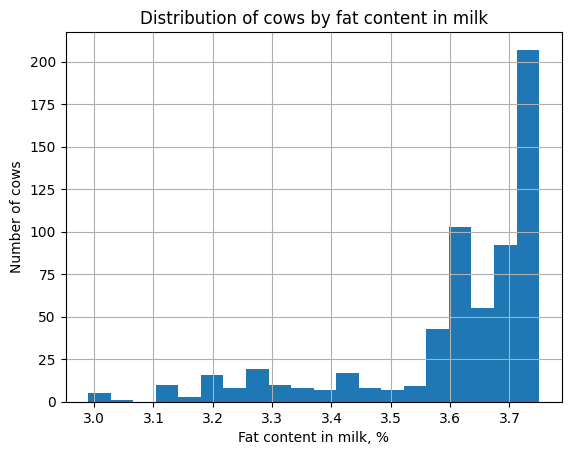

In [53]:
plt.ylabel('Number of cows')
plt.xlabel('Fat content in milk, %')
plt.title('Distribution of cows by fat content in milk')
df['fat_content'].hist(bins=20)
print()

**Most values are above 3.5% fat, distribution is left-skewed and not normal.**

<!-- removed colored markdown -->

Noted the non-normality in the summary below.

<!-- removed colored markdown -->

count    628.000000
mean       3.604268
std        0.168093
min        2.990000
25%        3.590000
50%        3.650000
75%        3.720000
max        3.750000
Name: fat_content, dtype: float64

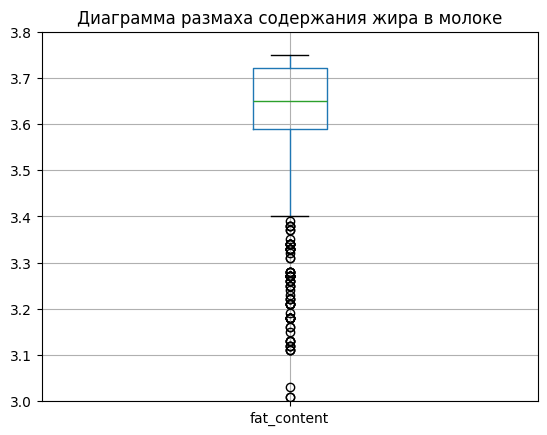

In [54]:
plt.title('Диаграмма размаха содержания жира в молоке')
plt.ylim(3, 3.8)
df.boxplot(column='fat_content')
df['fat_content'].describe()

**Distribution is left-skewed, so there are many outliers by the 1.5 IQR rule, but values are close together, so we keep them. Mean fat: 3.6%, median: 3.65%, min: 2.99%, max: 3.75%.**

### protein_content

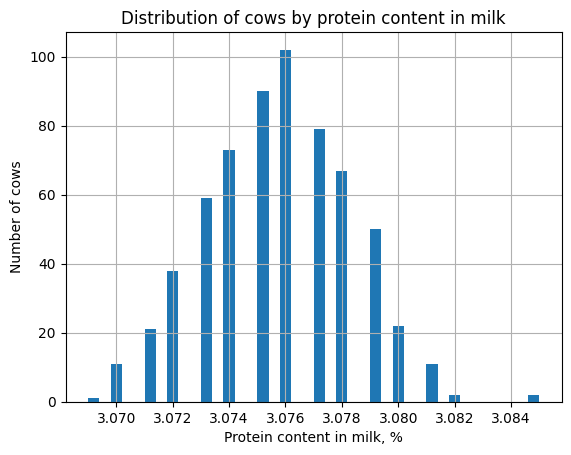

In [55]:
plt.ylabel('Number of cows')
plt.xlabel('Protein content in milk, %')
plt.title('Distribution of cows by protein content in milk')
df['protein_content'].hist(bins=40)
print()

**Distribution is similar to normal, but looks discrete, with gaps between values.**

<!-- removed colored markdown -->

Changed bins to 40, discrete nature is visible, distribution still looks normal.

<!-- removed colored markdown -->

count    628.000000
mean       3.075670
std        0.002551
min        3.069000
25%        3.074000
50%        3.076000
75%        3.077000
max        3.085000
Name: protein_content, dtype: float64

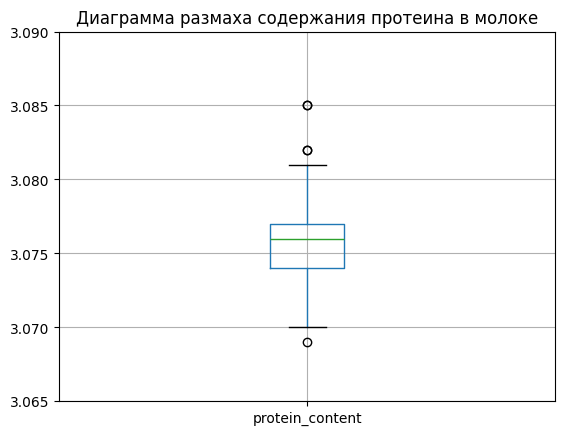

In [56]:
plt.title('Диаграмма размаха содержания протеина в молоке')
plt.ylim(3.065, 3.09)
df.boxplot(column='protein_content')
df['protein_content'].describe()

**Protein content in milk ranges from 3.069% to 3.085%, mean 3.0757%, median 3.076%. Three outliers, but differences are minor, so we ignore them.**

### id

**Since id differs by one from our table index, just remove this column.**

In [57]:
df.drop(labels='id', axis=1, inplace=True)

<!-- removed colored markdown -->

**Now let's look at categorical features**

### Categorical features

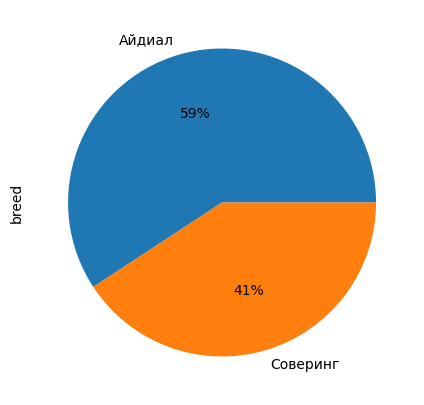

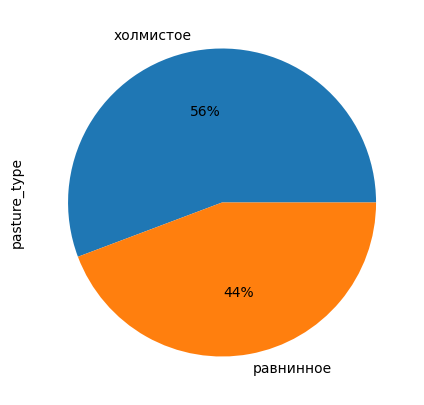

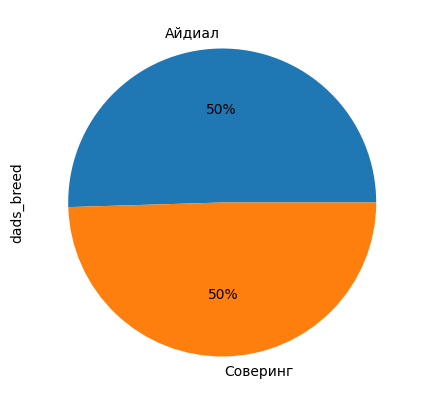

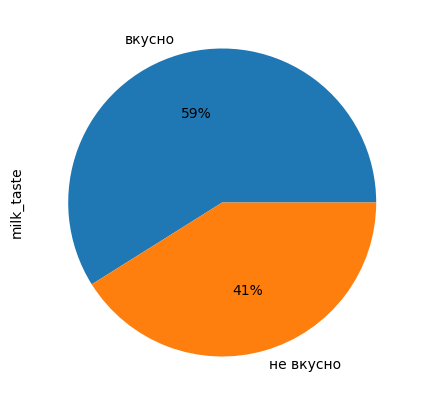

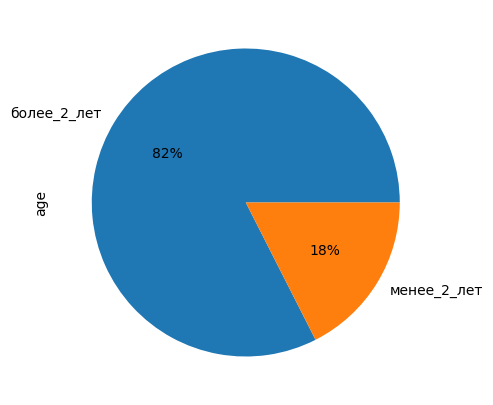

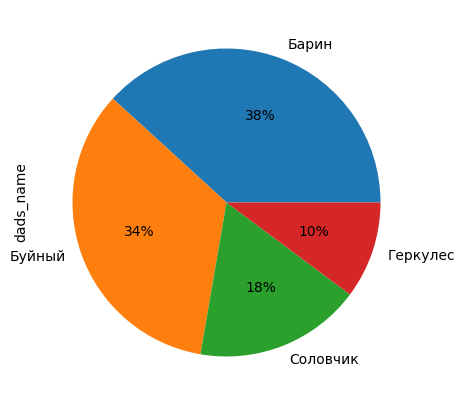

In [58]:
category_names = list(df.select_dtypes(include='object').columns)
for name in category_names:
    plt.figure(figsize=(5,5))
    df.groupby(name)[name].count().sort_values(ascending=False).plot(
    kind='pie',
    autopct='%1.0f%%'
    )


**From the pie charts above, we can conclude:**
   * There are 18% more "Vis Bik Ideal" cows than "Reflection Sovering"
   * 56% of cows graze on hilly pastures, 44% on plains
   * Half the cows have a "Sovering" bull father, the rest "Ideal"
   * Only 6 out of 10 cows produce tasty milk
   * Only 18% of cows are younger than 2 years, 82% are older
   * The bull "Barin" has the most offspring, "Hercules" the least

**Conclusions about quantitative features:**
 * Yield values are nearly normal, mean annual yield is 6125 kg, median 6132 kg 
 * Mean feed nutritional value is 14.55, median 14.7, right-skewed, no outliers, min 10.9, max 16.8
 * Mean protein in feed 1923.75g, median 1888g
 * Min SPR: 0.84, max: 0.96, mean: 0.913, median: 0.93. Histogram shows three SPR intervals, can be replaced with categorical feature.
 * Mean fat: 3.6%, median: 3.65%, left-skewed, many outliers by IQR, but values are close, so log-transform unlikely to help.
 * Protein content in milk: 3.069% to 3.085%, mean 3.0757%, median 3.076%. Three outliers, but differences are minor, so we ignore them.

<!-- removed colored markdown -->

## Correlation analysis

**For quantitative features, plot a heatmap of correlation coefficients.**

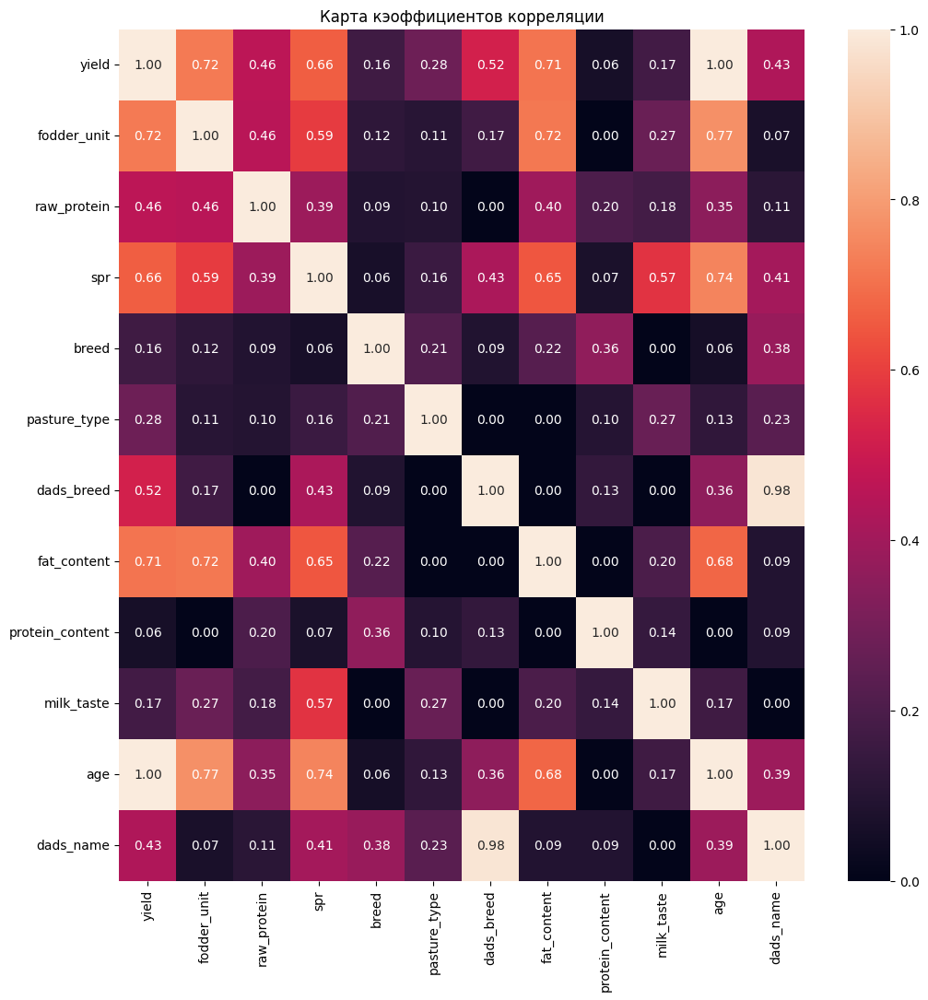

In [59]:
interval_cols=['yield', 'fodder_unit', 'raw_protein', 'spr', 'fat_content', 'protein_content']
fig, ax = plt.subplots(figsize=(12,12))
plt.title('Карта кэоффициентов корреляции')
sns.heatmap(df.phik_matrix(interval_cols=interval_cols),
            annot=True, 
            fmt='.2f',
            ax=ax) 
print()

<!-- removed colored markdown -->

Read and fixed, still learning the math behind phik correlation.

<!-- removed colored markdown -->

**Display pairs with the highest correlation, removing duplicates from the correlation matrix**

In [60]:
df_col = df.phik_matrix(interval_cols=interval_cols)
ind_arr = []
for ind in df_col.index:
    if (ind[0] != ind[1]) & (ind[::-1] not in ind_arr):
        ind_arr.append(ind)
ind_arr

['yield',
 'fodder_unit',
 'raw_protein',
 'spr',
 'breed',
 'pasture_type',
 'dads_breed',
 'fat_content',
 'protein_content',
 'milk_taste',
 'age',
 'dads_name']

In [61]:
df_col

,yield,fodder_unit,raw_protein,spr,breed,pasture_type,dads_breed,fat_content,protein_content,milk_taste,age,dads_name
yield,1.000000,0.720719,0.463224,0.661359,0.164744,0.279540,0.519915,0.707654,0.058970,0.173122,0.998101,0.433409
fodder_unit,0.720719,1.000000,0.456484,0.591190,0.123086,0.106758,0.171355,0.715914,0.000000,0.272265,0.771596,0.069197
raw_protein,0.463224,0.456484,1.000000,0.387188,0.090925,0.096474,0.000000,0.397380,0.202474,0.176480,0.351685,0.111229
spr,0.661359,0.591190,0.387188,1.000000,0.062660,0.155349,0.425601,0.645581,0.073787,0.572702,0.744410,0.409142
breed,0.164744,0.123086,0.090925,0.062660,1.000000,0.213218,0.089330,0.222825,0.361851,0.000000,0.057295,0.382644
pasture_type,0.279540,0.106758,0.096474,0.155349,0.213218,1.000000,0.000000,0.000000,0.099908,0.269063,0.128455,0.233149
dads_breed,0.519915,0.171355,0.000000,0.425601,0.089330,0.000000,1.000000,0.000000,0.134582,0.000000,0.355817,0.982909
fat_content,0.707654,0.715914,0.397380,0.645581,0.222825,0.000000,0.000000,1.000000,0.000000,0.198793,0.677913,0.090409
protein_content,0.058970,0.000000,0.202474,0.073787,0.361851,0.099908,0.134582,0.000000,1.000000,0.143857,0.000000,0.091102
milk_taste,0.173122,0.272265,0.176480,0.572702,0.000000,0.269063,0.000000,0.198793,0.143857,1.000000,0.165974,0.000000


In [62]:
df_col['yield'].sort_values(ascending=False)

yield              1.000000
age                0.998101
fodder_unit        0.720719
fat_content        0.707654
spr                0.661359
dads_breed         0.519915
raw_protein        0.463224
dads_name          0.433409
pasture_type       0.279540
milk_taste         0.173122
breed              0.164744
protein_content    0.058970
Name: yield, dtype: float64

**Highest chi-square correlation with target: Yield - Age: 0.998, Yield - Fodder unit: 0.765, Yield - Fat content: 0.708, Yield - SPR: 0.661. Multicollinearity is usually considered at correlation above 0.9; our max between features is 0.77, so we can ignore it here.**

<!-- removed colored markdown -->

Fixed, phik correlation shows strong age-yield correlation, still not clear why 0.9 is the threshold.

<!-- removed colored markdown -->

**Now plot scatterplots for yield and all other quantitative features, colored by categorical features.**

In [63]:
numeric = df.select_dtypes(include='number').drop(labels='yield', axis=1)
category = df.select_dtypes(include='object')
category.columns

Index(['breed', 'pasture_type', 'dads_breed', 'milk_taste', 'age',
       'dads_name'],
      dtype='object')

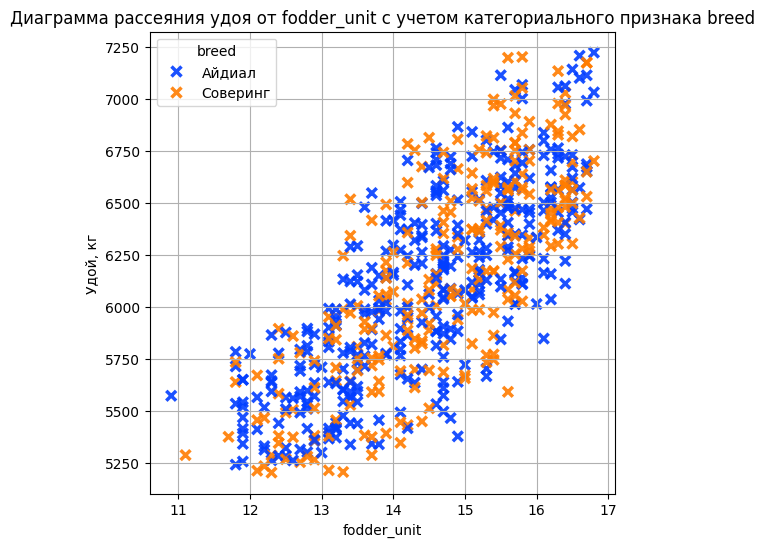

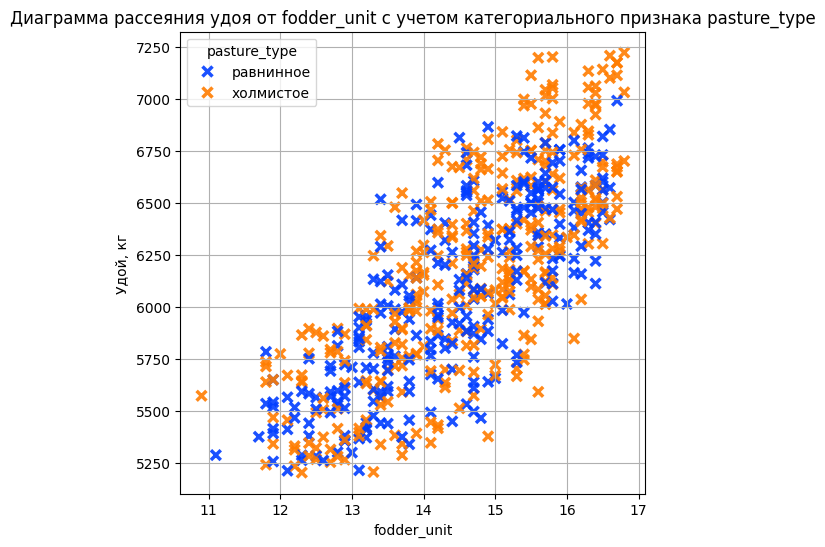

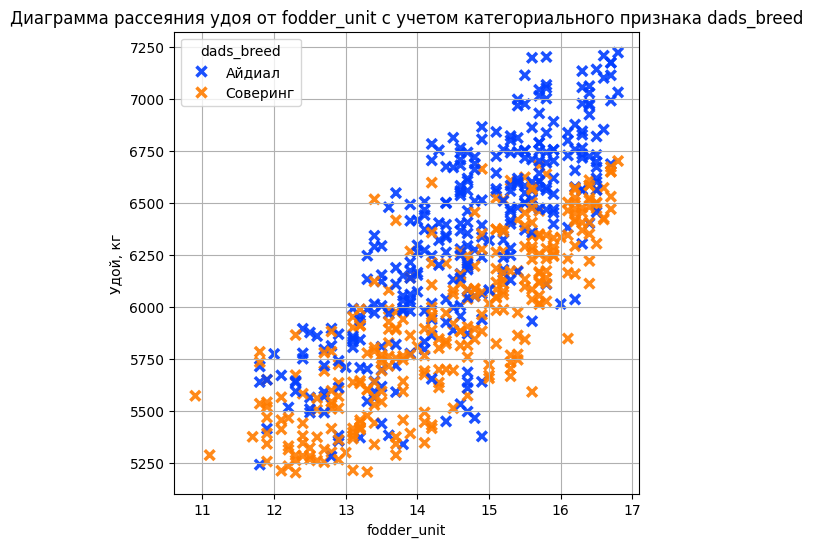

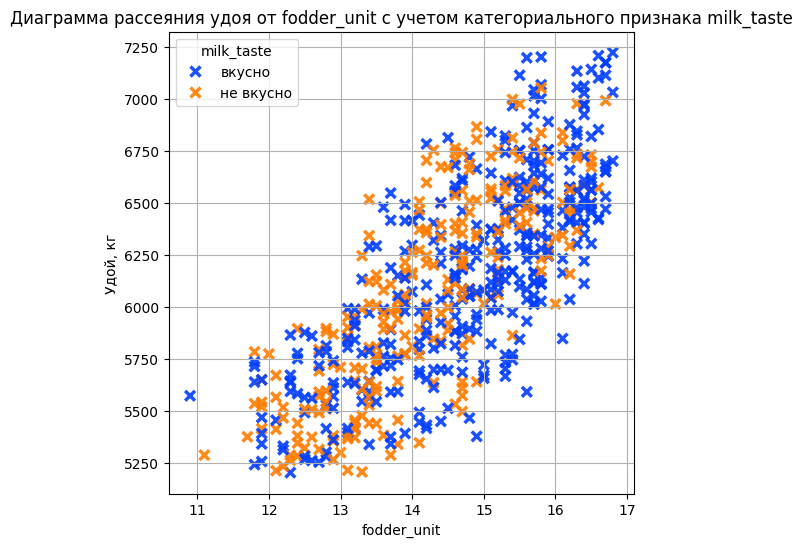

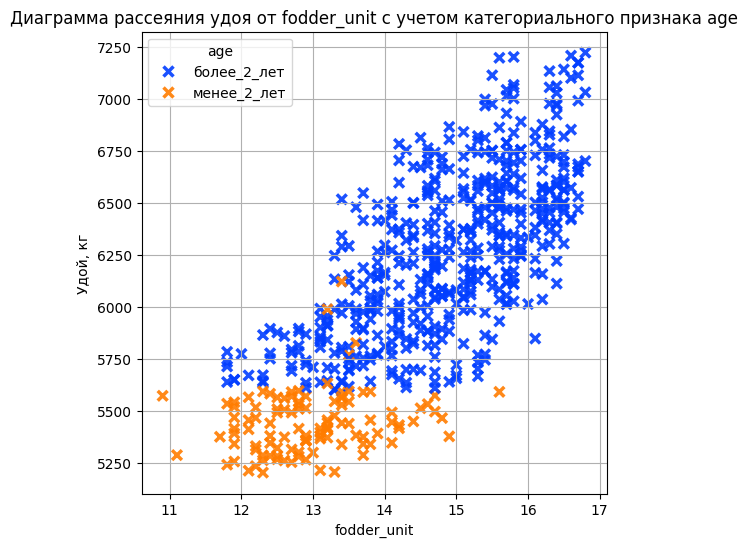

...

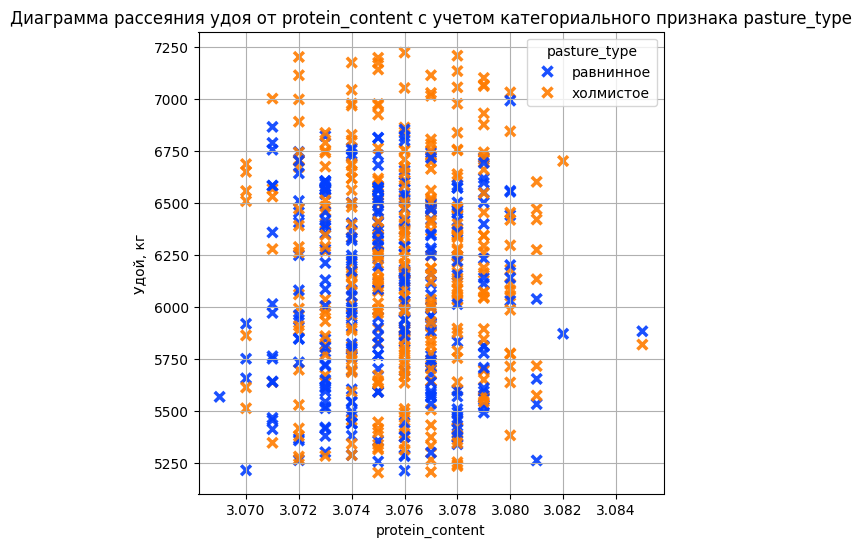

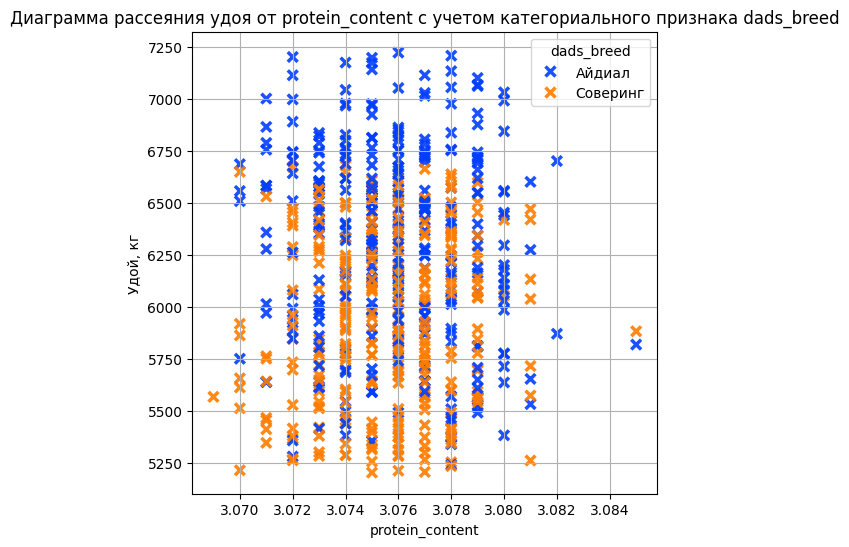

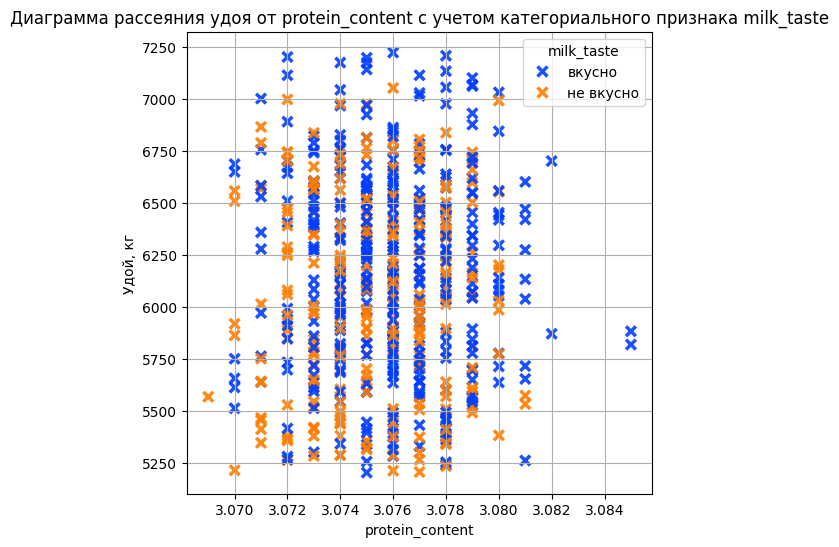

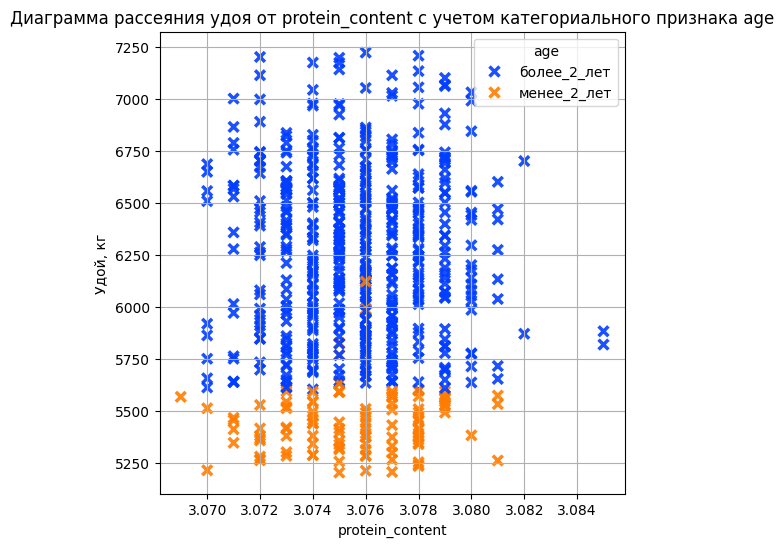

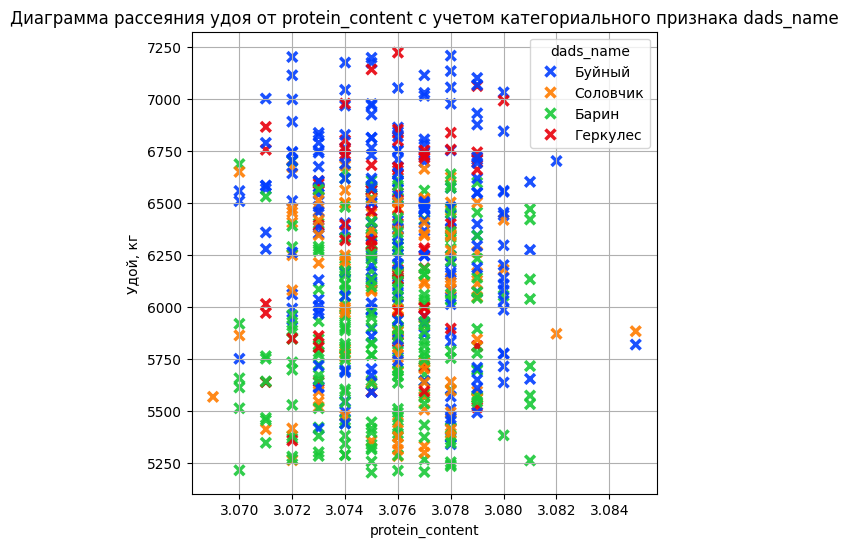

In [64]:
for num_column in numeric.columns:
    for cat_column in category.columns: 
        fig, ax = plt.subplots(figsize=(6, 6))
        sns.scatterplot(
            data=df, 
            x=num_column, 
            y="yield", 
            hue=cat_column, 
            palette="bright",
            linewidth=2.5,
            ax=ax,
            marker="x",
            alpha=0.9,
            s=50
        )
        plt.grid()
        plt.xlabel(num_column)
        plt.ylabel('Удой, кг')
        plt.title(f'Диаграмма рассеяния удоя от {num_column} с учетом категориального признака {cat_column}')

**Let's look in detail at the four features most correlated with yield: SPR, Fodder unit, Fat content, and Raw protein.**

### spr and categorical features

**SPR is the most correlated with the target (yield), which is logical since metabolism depends on nutrition. Let's look at yield vs SPR scatterplots.**

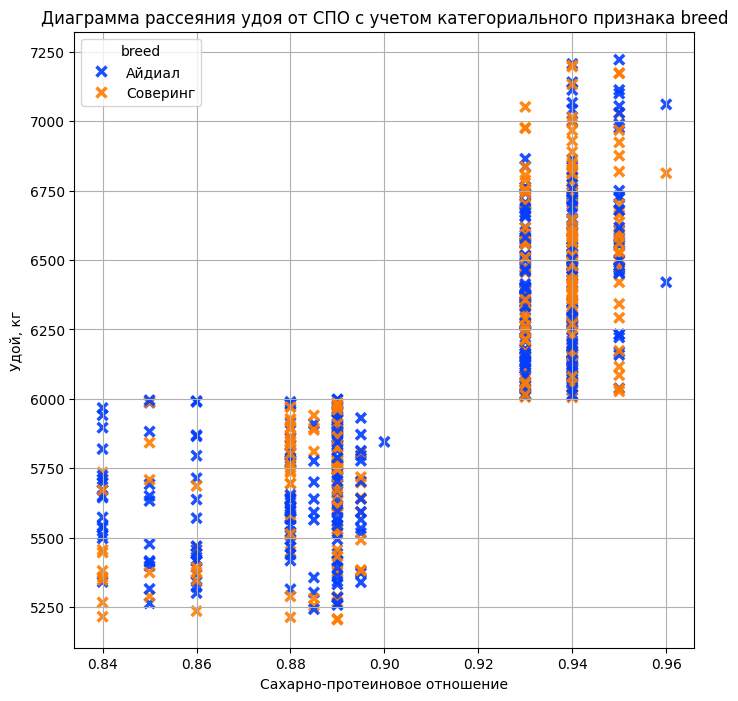

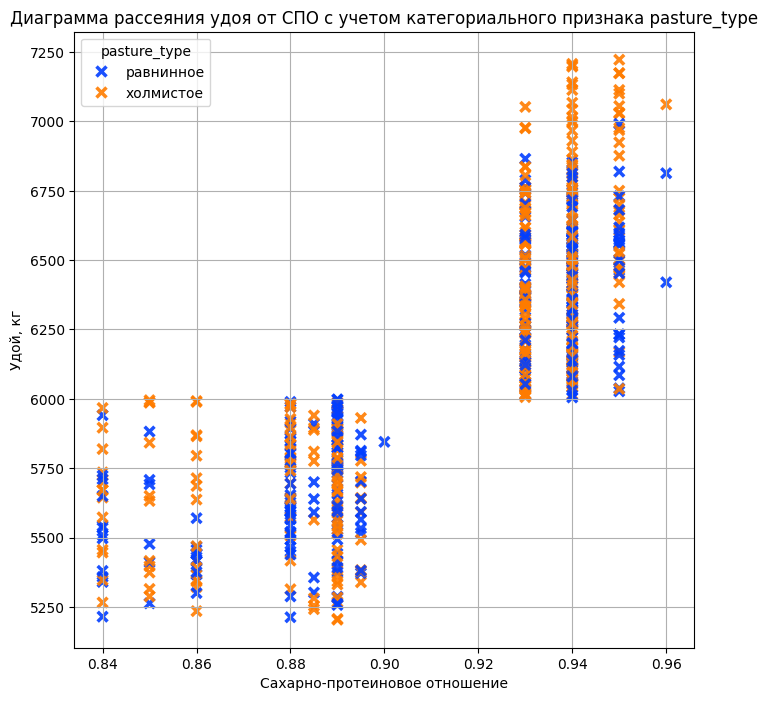

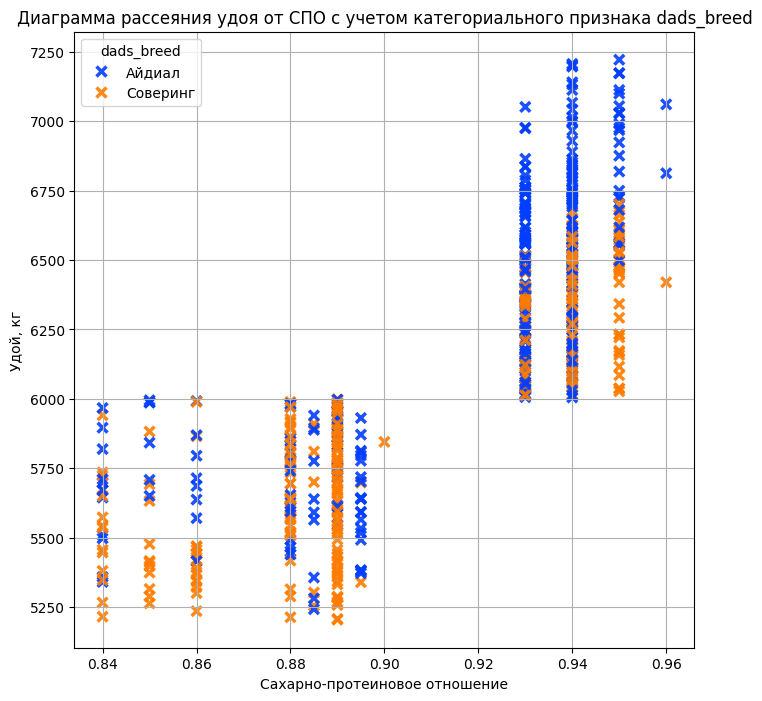

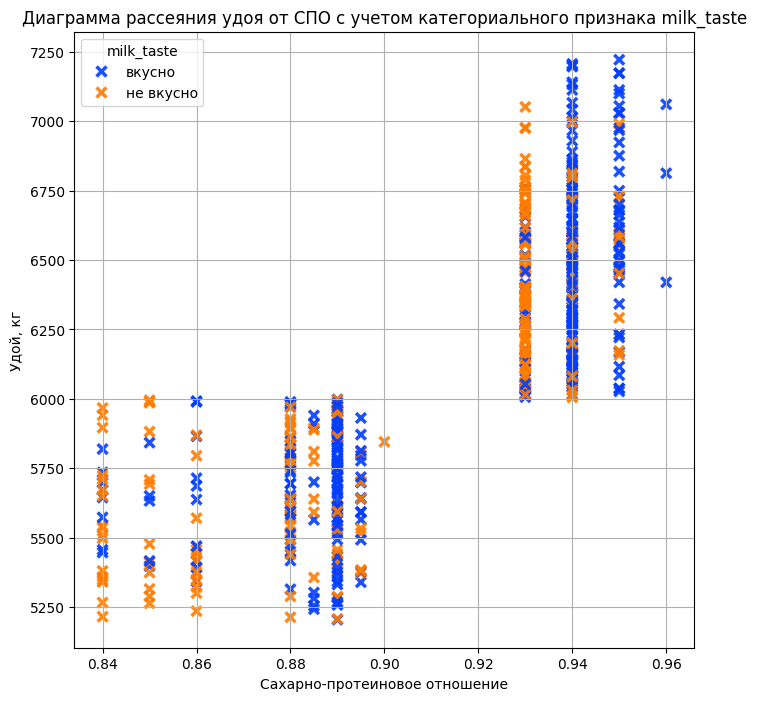

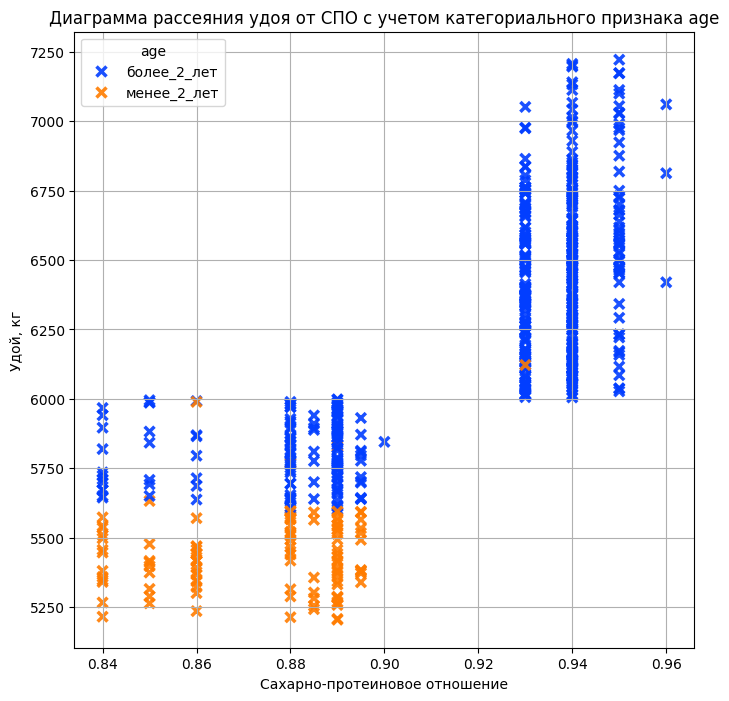

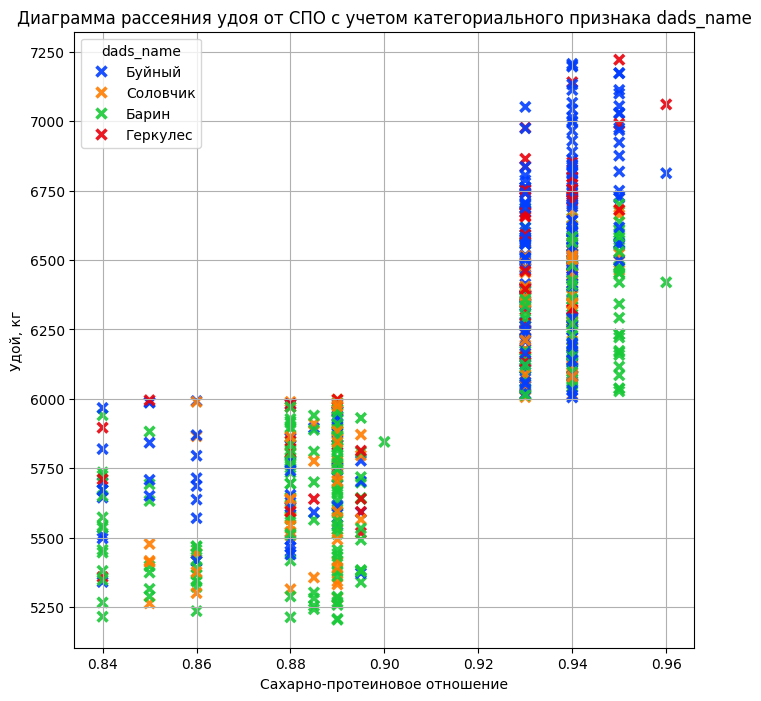

In [65]:
for cat_column in category.columns: 
        fig, ax = plt.subplots(figsize=(8, 8))
        sns.scatterplot(
            data=df, 
            x="spr", 
            y="yield", 
            hue=cat_column, 
            palette="bright",
            linewidth=2.5,
            ax=ax,
            marker="x",
            alpha=0.9,
            s=50
        )
        plt.grid()
        plt.xlabel('Сахарно-протеиновое отношение')
        plt.ylabel('Удой, кг')
        plt.title(f'Диаграмма рассеяния удоя от СПО с учетом категориального признака {cat_column}')

**SPR splits the dataset into two groups: SPR < 0.9 (yield 5250–6000 kg) and SPR > 0.9 (yield 6000–7250 kg). This feature can be replaced with a categorical one. Younger cows have lower yield. Highest yields at SPR > 0.9 are from cows grazing on hills; at SPR > 0.9, cows fathered by "Barin" have lower yields. At SPR > 0.94, milk is mostly rated tasty.**

<!-- removed colored markdown -->

### fodder_unit and categorical features

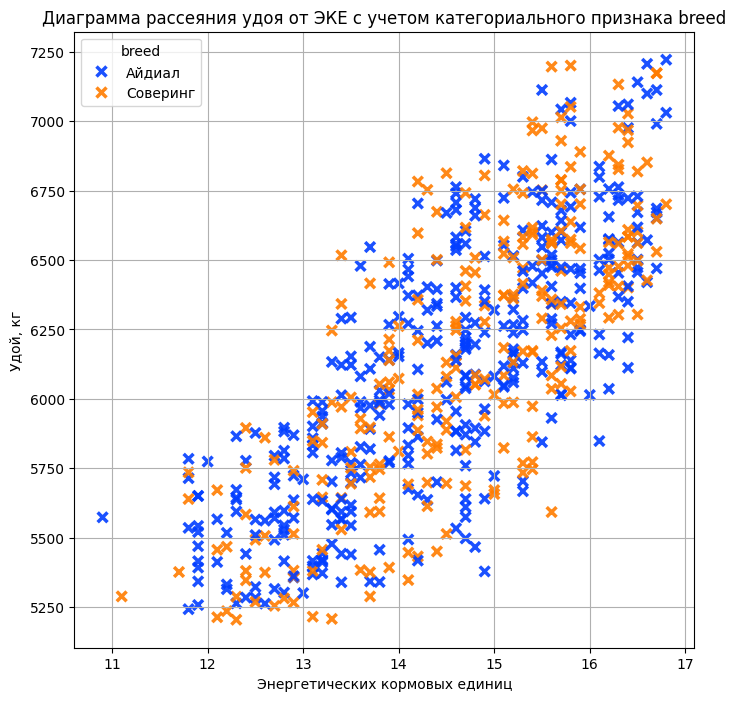

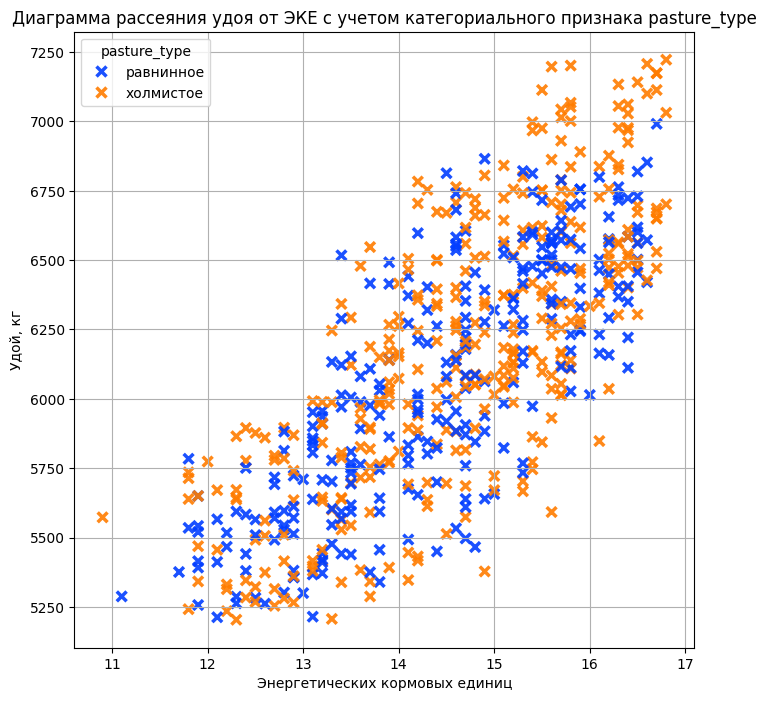

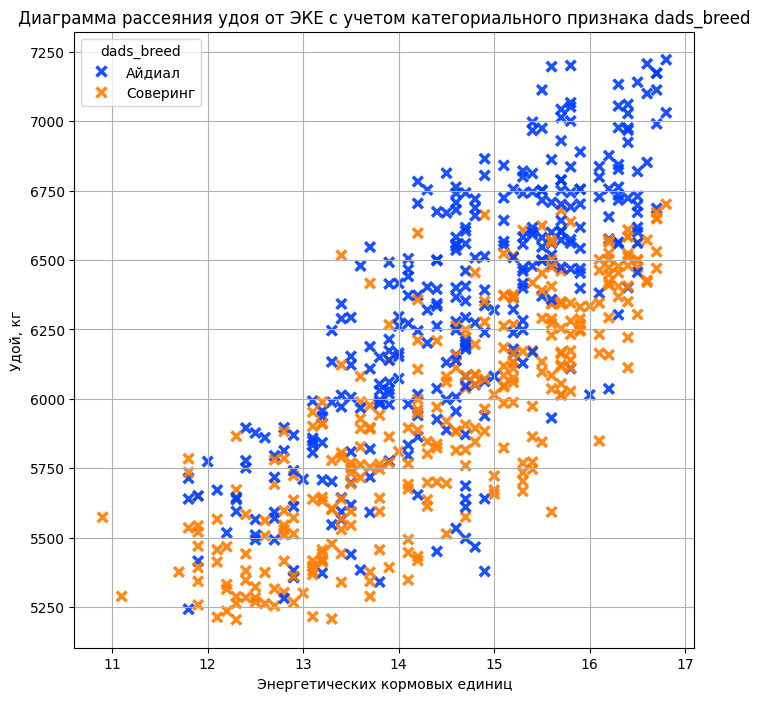

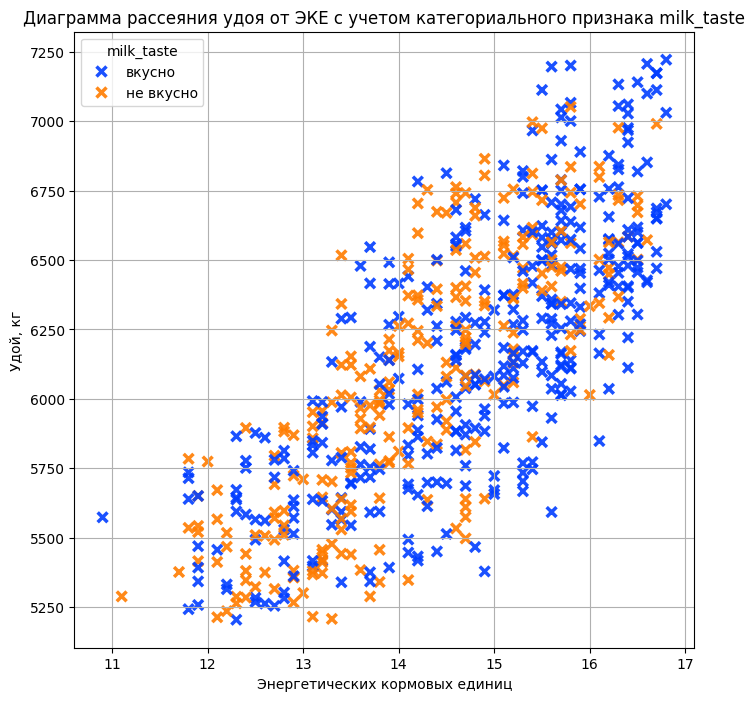

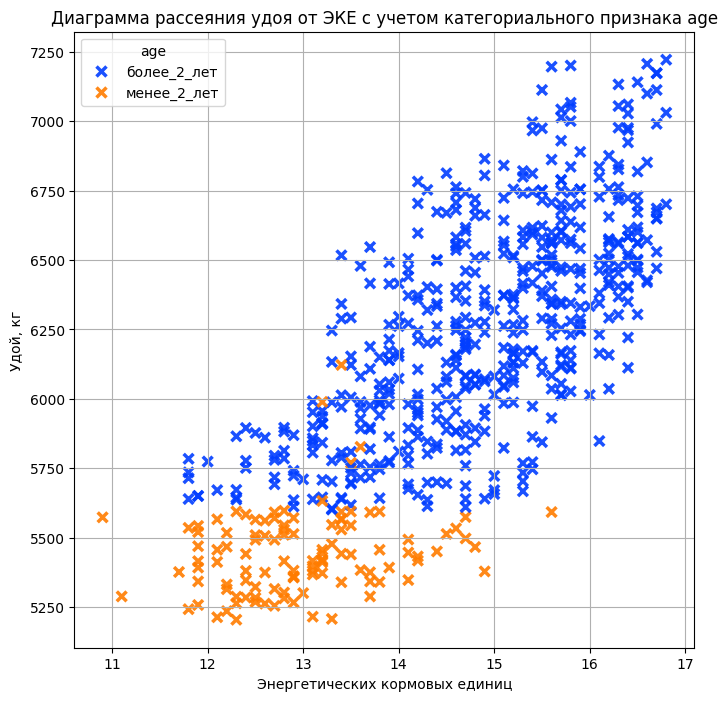

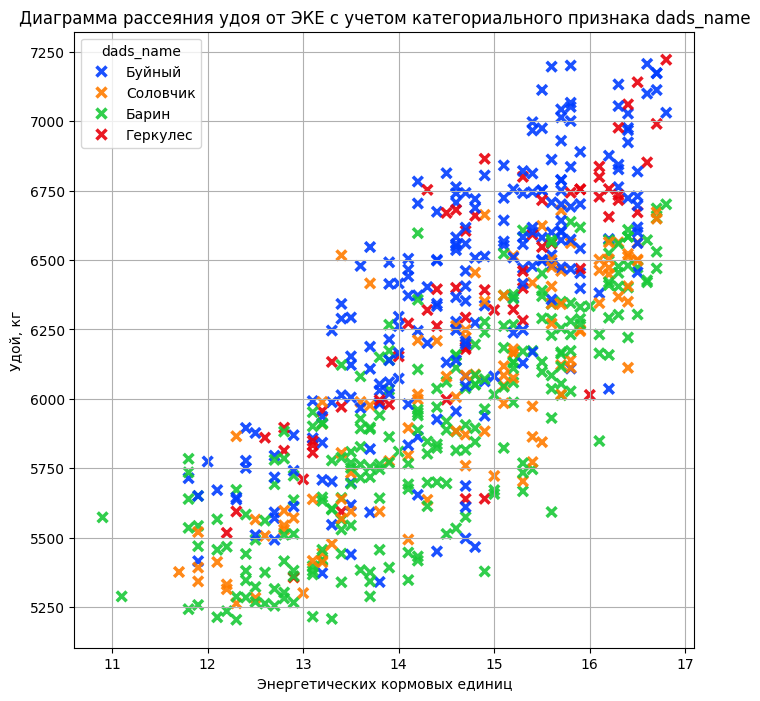

In [66]:
for cat_column in category.columns: 
        fig, ax = plt.subplots(figsize=(8, 8))
        sns.scatterplot(
            data=df, 
            x="fodder_unit", 
            y="yield", 
            hue=cat_column, 
            palette="bright",
            linewidth=2.5,
            ax=ax,
            marker="x",
            alpha=0.9,
            s=50
        )
        plt.grid()
        plt.xlabel('Энергетических кормовых единиц')
        plt.ylabel('Удой, кг')
        plt.title(f'Диаграмма рассеяния удоя от ЭКЕ с учетом категориального признака {cat_column}')

**Fodder unit is positively linearly/quadratically correlated with yield; all previous conclusions are also visible here, due to multicollinearity. No separate conclusions needed.**

<!-- removed colored markdown -->

Fixed the conclusion, but the quadratic relationship is not obvious from the scatterplot.

<!-- removed colored markdown -->

### fat_content and categorical features

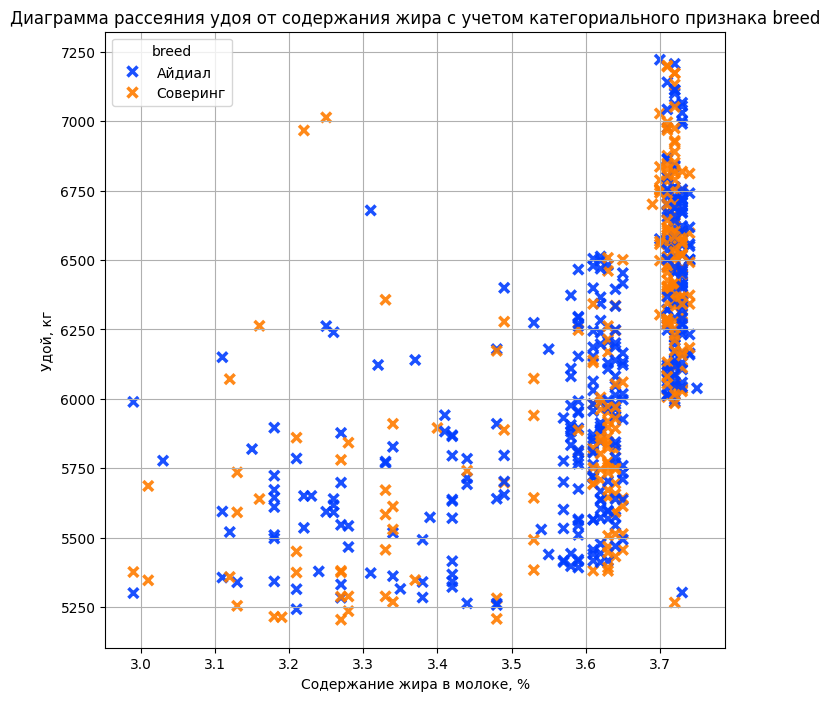

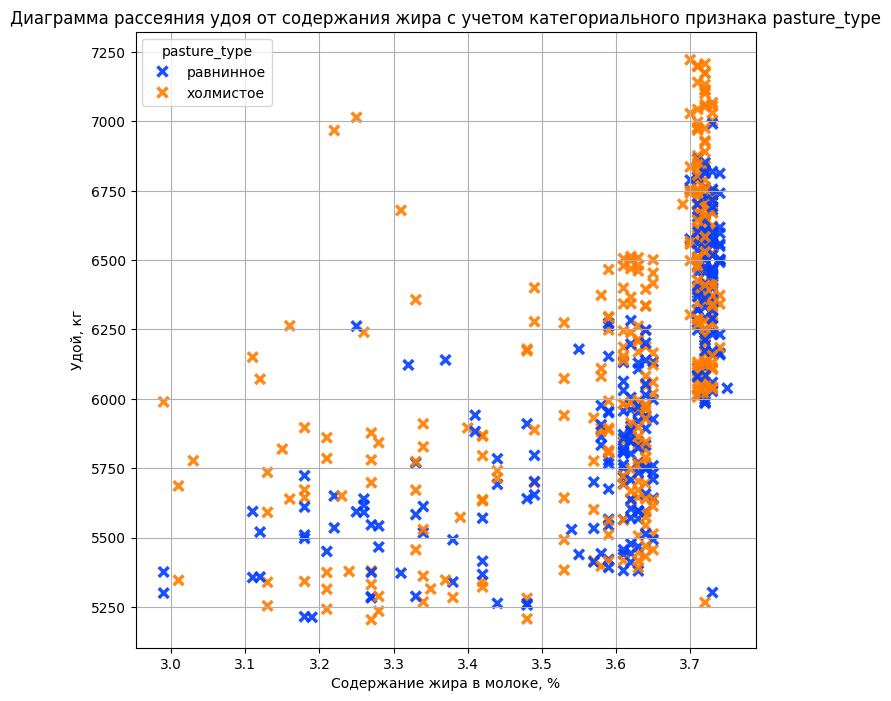

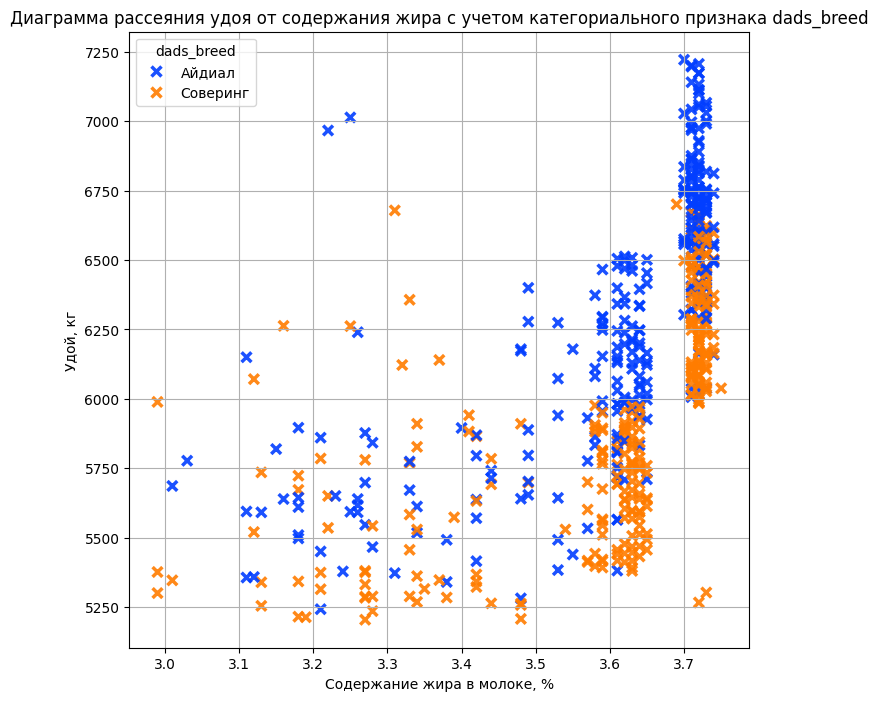

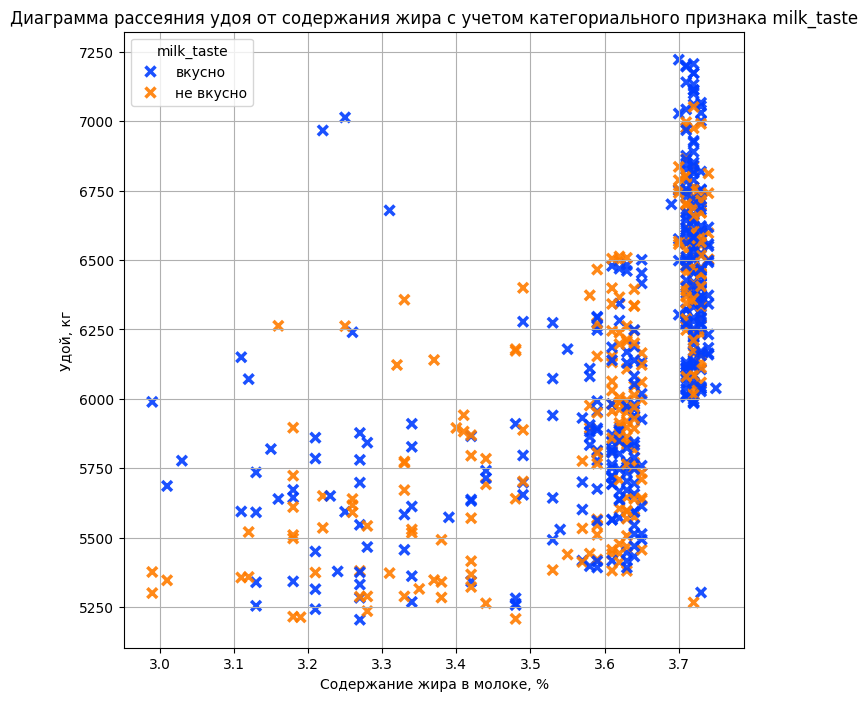

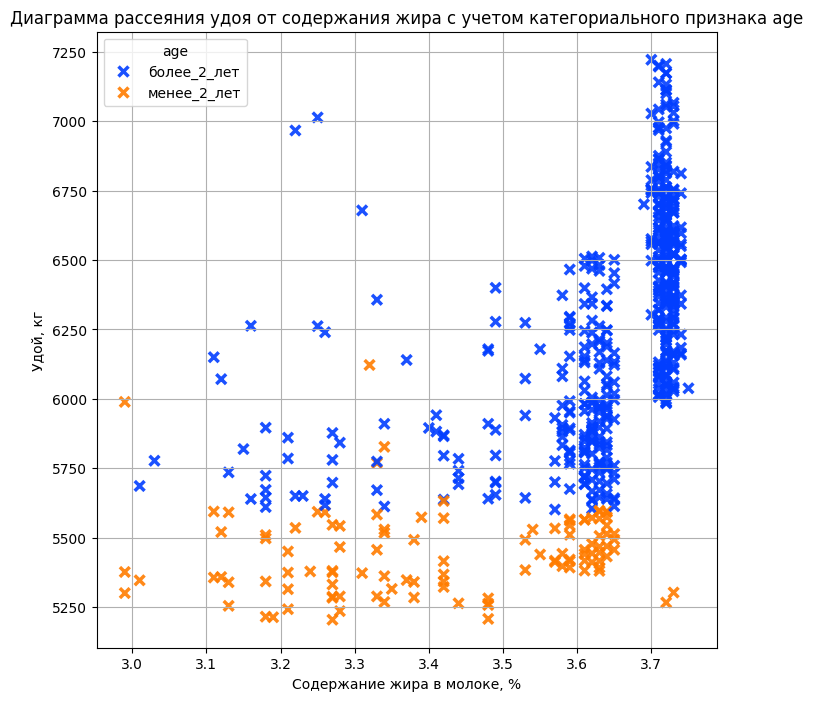

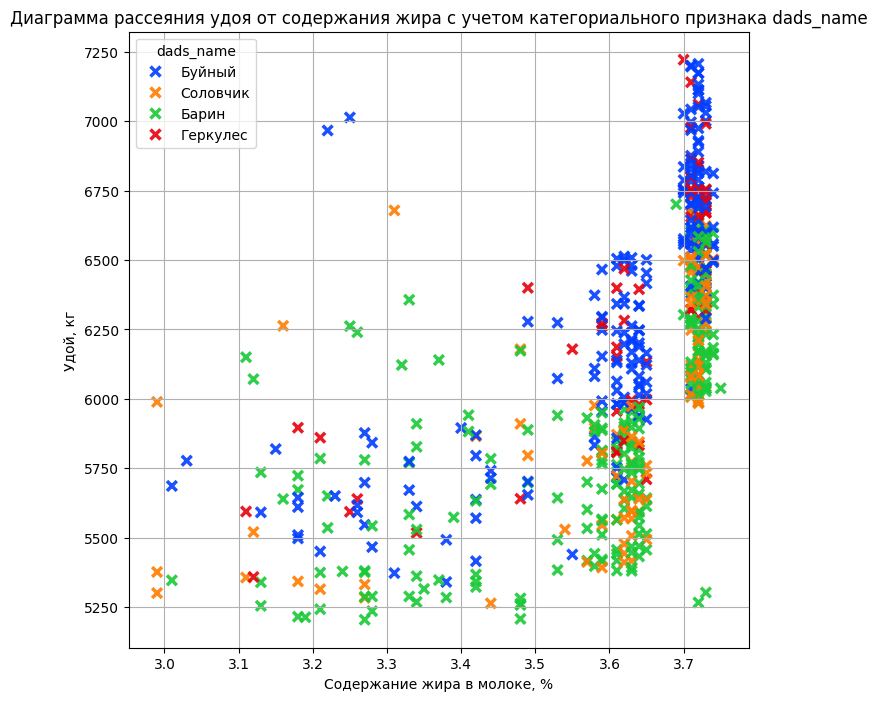

In [67]:
for cat_column in category.columns: 
        fig, ax = plt.subplots(figsize=(8, 8))
        sns.scatterplot(
            data=df, 
            x="fat_content", 
            y="yield", 
            hue=cat_column, 
            palette="bright",
            linewidth=2.5,
            ax=ax,
            marker="x",
            alpha=0.9,
            s=50
        )
        plt.grid()
        plt.xlabel('Содержание жира в молоке, %')
        plt.ylabel('Удой, кг')
        plt.title(f'Диаграмма рассеяния удоя от содержания жира с учетом категориального признака {cat_column}')

**The area with fat >3.5% is denser (more cows with higher fat), and the highest yields are in this area. The 3.7% fat cluster is higher than values to its left.**

### raw_protein and categorical features

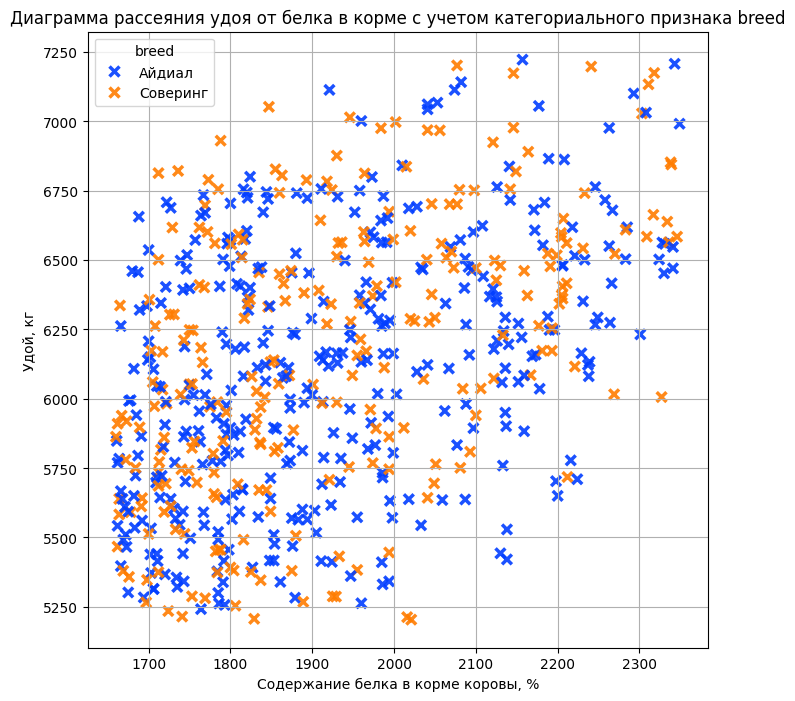

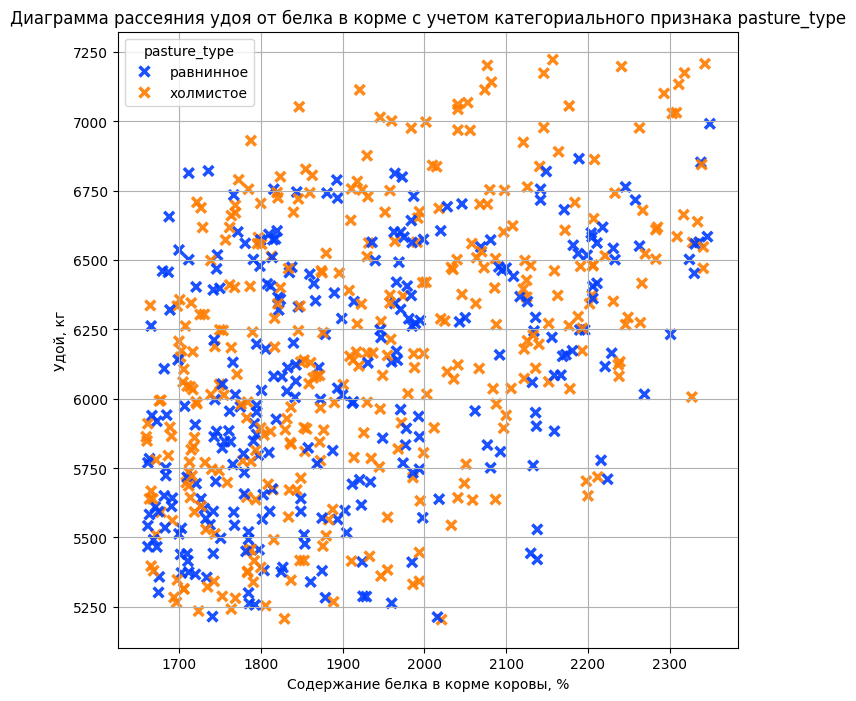

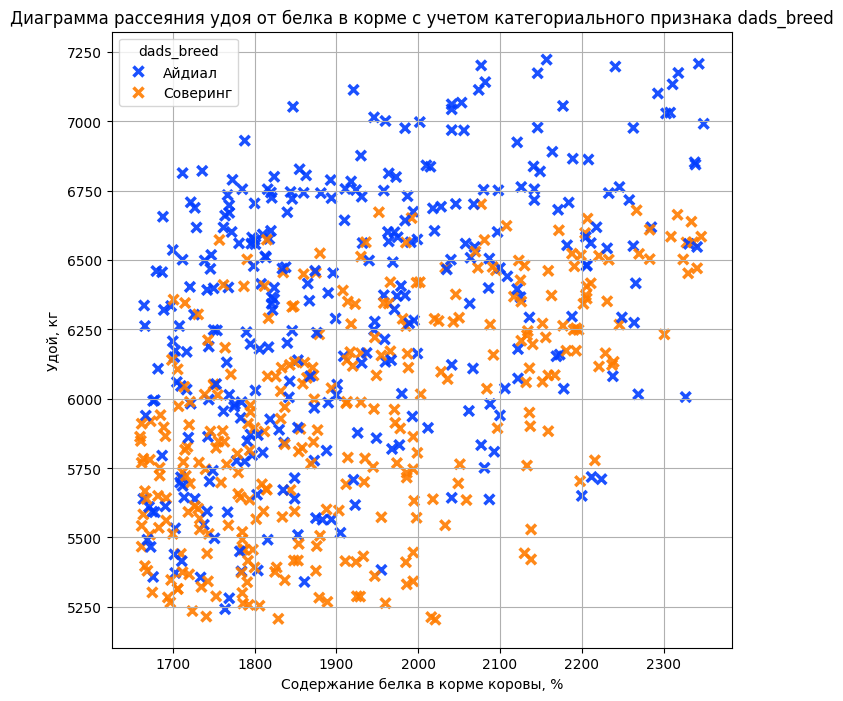

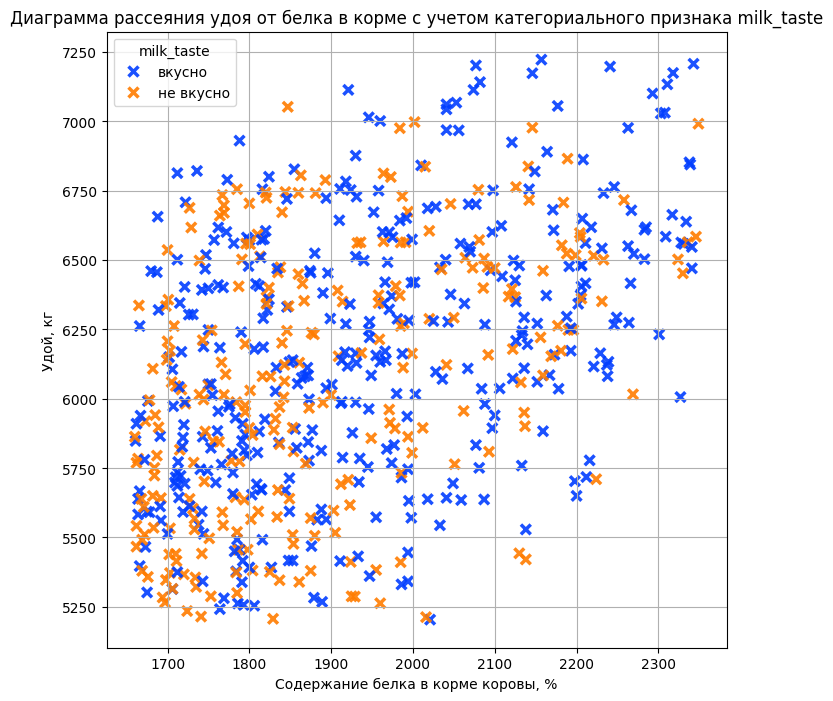

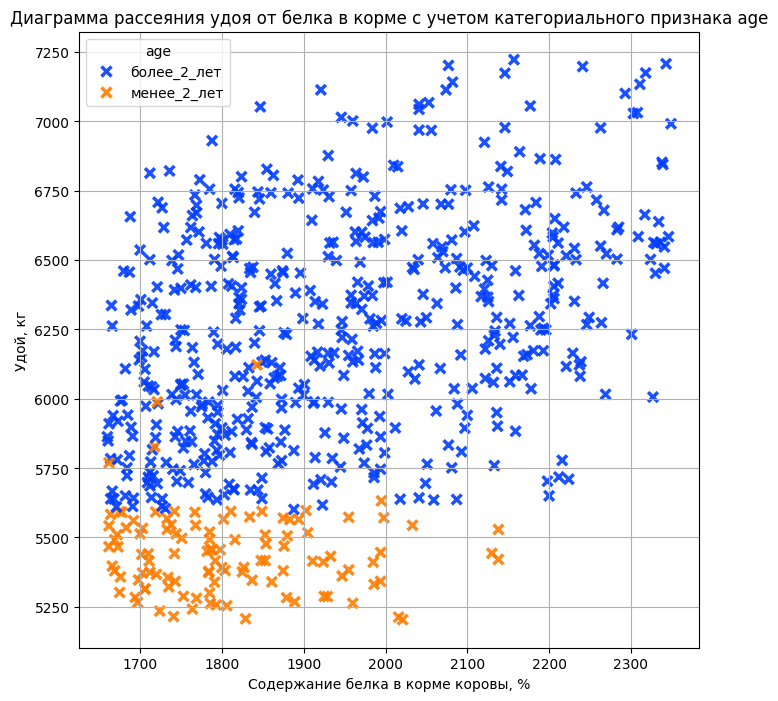

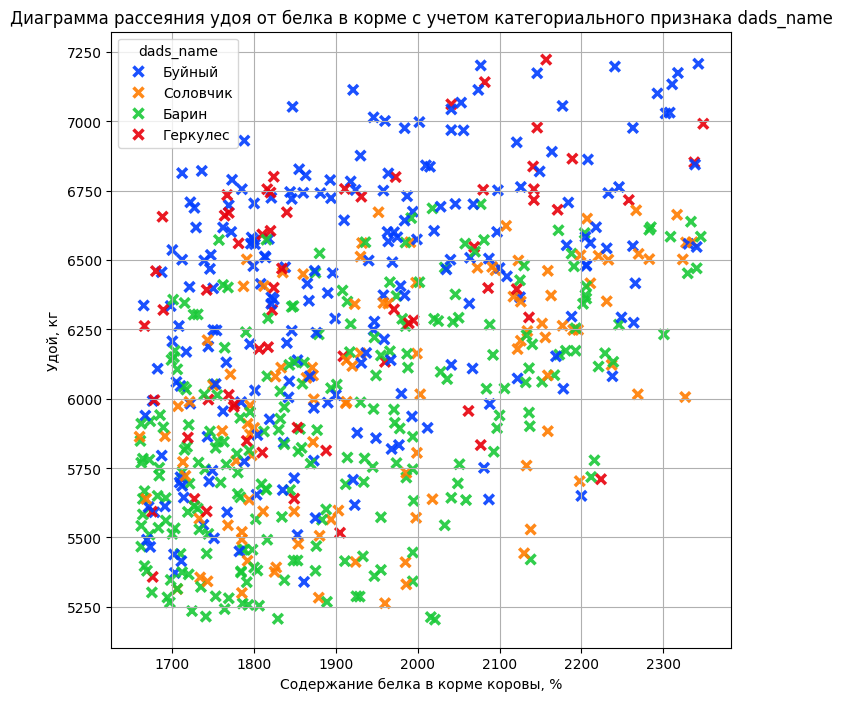

In [68]:
for cat_column in category.columns: 
        fig, ax = plt.subplots(figsize=(8, 8))
        sns.scatterplot(
            data=df, 
            x="raw_protein", 
            y="yield", 
            hue=cat_column, 
            palette="bright",
            linewidth=2.5,
            ax=ax,
            marker="x",
            alpha=0.9,
            s=50
        )
        plt.grid()
        plt.xlabel('Содержание белка в корме коровы, %')
        plt.ylabel('Удой, кг')
        plt.title(f'Диаграмма рассеяния удоя от белка в корме с учетом категориального признака {cat_column}')

**Weak linear relationship; cows fathered by "Ideal" have higher yield at the same feed protein content than those fathered by "Sovering".**

### Correlation spr and fodder_unit

C:\Users\datre\AppData\Local\Temp\ipykernel_15396\3054129909.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


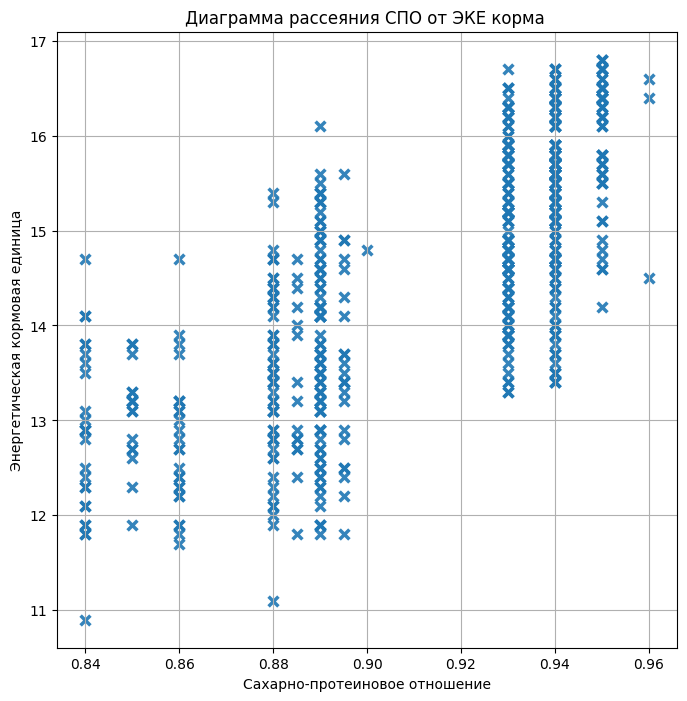

In [69]:

        fig, ax = plt.subplots(figsize=(8, 8))
        sns.scatterplot(
            data=df, 
            x="spr", 
            y="fodder_unit", 
            palette="bright",
            linewidth=2.5,
            ax=ax,
            marker="x",
            alpha=0.9,
            s=50
        )
        plt.grid()
        plt.xlabel('Сахарно-протеиновое отношение')
        plt.ylabel('Энергетическая кормовая единица')
        plt.title(f'Диаграмма рассеяния СПО от ЭКЕ корма ')
print()

**Scatterplot shows a positive linear trend; multicollinearity should be considered when training the model.**

**Correlation analysis summary:**

   * Four features most correlated with target (yield): Age (0.998), SPR (0.806), Fodder unit (0.765), Fat content (0.708)
   * SPR splits the dataset into two clusters: SPR < 0.9 (yield 5250–6000 kg), SPR > 0.9 (yield 6000–7250 kg); can be replaced with categorical
   * Younger cows have much lower yield
   * Highest yields at SPR > 0.9 are from cows grazing on hills; at SPR > 0.9, cows fathered by "Barin" have lower yields
   * Cows fathered by "Ideal" have higher yield at same feed protein content than those fathered by "Sovering"

   * Target correlates with Fodder unit, relationship is linear/quadratic
   * SPR splits data into two clusters, should be made categorical

<!-- removed colored markdown -->

Fixed

## Linear regression model training

### First model - LR1

**For the first model, use only features present in the dataset, based on correlation analysis and logic. Quantitative: fodder_unit, spr, raw_protein. Categorical: age, pasture_type, breed, dads_breed.**

In [70]:
num_ft_lr1 = ['fodder_unit', 'spr', 'raw_protein']
cat_ft_lr1 = ['age', 'pasture_type', 'breed', 'dads_breed']

<!-- removed colored markdown -->

Fixed, kept raw_protein in feed, not protein in milk.

<!-- removed colored markdown -->

**Split data into train and test sets.**

In [71]:
X = df.drop('yield', axis=1)
y = df['yield']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=RANDOM_STATE)

**Scale quantitative features with StandardScaler and encode categorical features with OHE.**

In [72]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train[num_ft_lr1])
X_test_scaled = scaler.transform(X_test[num_ft_lr1])

encoder = OneHotEncoder(drop='first', sparse_output=False)

X_train_ohe = encoder.fit_transform(X_train[cat_ft_lr1])
X_test_ohe = encoder.transform(X_test[cat_ft_lr1])
encoder_col_names = encoder.get_feature_names_out()

**Combine scaled and encoded features into one dataframe.**

In [73]:
X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_ft_lr1)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_ft_lr1)

X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

In [74]:
X_train.head()

,age_менее_2_лет,pasture_type_холмистое,breed_Соверинг,dads_breed_Соверинг,fodder_unit,spr,raw_protein
0,0.0,1.0,0.0,0.0,-0.132355,0.804308,0.755921
1,0.0,0.0,1.0,0.0,1.497937,0.804308,-0.845231
2,0.0,1.0,0.0,1.0,1.265038,0.804308,1.966414
3,0.0,1.0,0.0,0.0,0.566341,0.804308,-0.559114
4,0.0,1.0,1.0,1.0,-1.452115,-0.759164,-1.395455


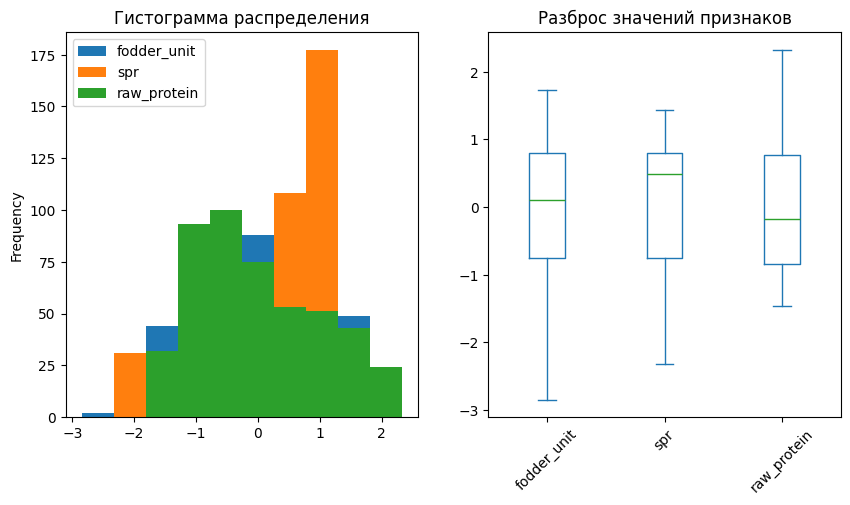

In [75]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

X_train[num_ft_lr1].plot(kind='hist', bins=10, ax=axes[0])
axes[0].set_title('Гистограмма распределения')
X_train[num_ft_lr1].plot(kind='box',   ax=axes[1], rot=45)
axes[1].set_title('Разброс значений признаков')
plt.show()

**Scaling successful, quantitative features are on the same scale. Now train the linear regression model and calculate MAE and R2.**

In [76]:
model_lr1 = LinearRegression()
model_lr1.fit(X_train, y_train)
predictions_lr1 = model_lr1.predict(X_test)

mae = mean_absolute_error(y_test, predictions_lr1)
r2 = r2_score(y_test, predictions_lr1)  

print(f'MAE = {mae:.0f}')
print(f'R2 = {r2:.3f}')

MAE = 171
R2 = 0.806


<!-- removed colored markdown -->

**Analyze residuals: plot histogram and scatterplot of residuals.**

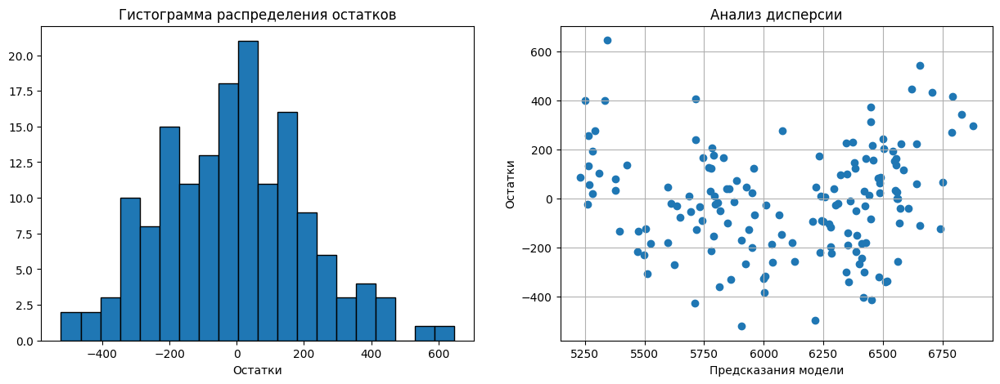

In [77]:
residuals = y_test - predictions_lr1

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
axes[0].hist(residuals, bins=20, edgecolor='black')
axes[0].set_title('Гистограмма распределения остатков')
axes[0].set_xlabel('Остатки')
axes[1].scatter(x=predictions_lr1, y=residuals)
axes[1].set_xlabel('Предсказания модели')
axes[1].set_ylabel('Остатки')
axes[1].set_title('Анализ дисперсии')

plt.grid()
plt.show()

**Residuals are nearly normal. Scatterplot shows some nonlinearity: for predictions <5500 kg and >6500 kg, errors are mostly underestimates; in between, overestimates.**

**First linear regression model summary:**

   * R2: 0.803 - decent, but can be improved.
   * Residual analysis shows some nonlinearity, but histogram is normal.
   * Since nonlinearity and multicollinearity were found, add new features to reduce their effect.

<!-- removed colored markdown -->

### Second model - LR2

**First, create a function to repeat all steps from the first model for data preparation and training, and a function for residual plots.**

In [78]:
def lr_model_fitting(df, num_features, cat_features, target='yield'):
    X = df.drop(target, axis=1)
    y = df[target]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=RANDOM_STATE)
    
    scaler = StandardScaler()

    X_train_scaled = scaler.fit_transform(X_train[num_features])
    X_test_scaled = scaler.transform(X_test[num_features])

    encoder = OneHotEncoder(drop='first', sparse_output=False)

    X_train_ohe = encoder.fit_transform(X_train[cat_features])
    X_test_ohe = encoder.transform(X_test[cat_features])
    encoder_col_names = encoder.get_feature_names_out()
    
    X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
    X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

    X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_features)
    X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_features)

    X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
    X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

    model_lr = LinearRegression()
    model_lr.fit(X_train, y_train)
    predictions = model_lr.predict(X_test)
    
    return X_train, X_test, y_train, y_test, model_lr, predictions, scaler, encoder

In [79]:
def residuals_graph(y_test, predictions):
    residuals = y_test - predictions

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
    axes[0].hist(residuals, bins=20, edgecolor='black')
    axes[0].set_title('Гистограмма распределения остатков')
    axes[0].set_xlabel('Остатки')
    axes[1].scatter(x=predictions, y=residuals)
    axes[1].set_xlabel('Предсказания модели')
    axes[1].set_ylabel('Остатки')
    axes[1].set_title('Анализ дисперсии')

    plt.grid()
    plt.show()
    
    return fig, axes

**For the second model, convert SPR from quantitative to categorical, splitting at 0.9 as seen in the scatterplot.**

C:\Users\datre\AppData\Local\Temp\ipykernel_15396\1455787774.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


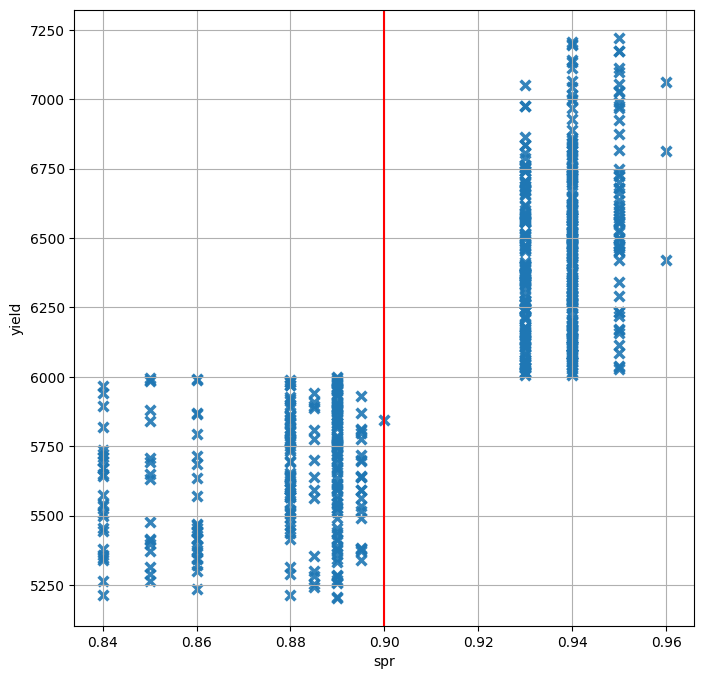

In [80]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.scatterplot(
            data=df, 
            x="spr", 
            y="yield", 
            palette="bright",
            linewidth=2.5,
            ax=ax,
            marker="x",
            alpha=0.9,
            s=50)
plt.axvline(x = 0.9, color = 'r')
plt.grid()

In [81]:
df['spr_cat'] = df['spr'] > 0.9

**Also add a new feature: fodder_unit squared, and see its effect.**

In [82]:
df['fodder_unit_sq'] = df['fodder_unit']**2

**Now train the new LR2 model with new features and check metrics.**

MAE = 161
R2 = 0.828


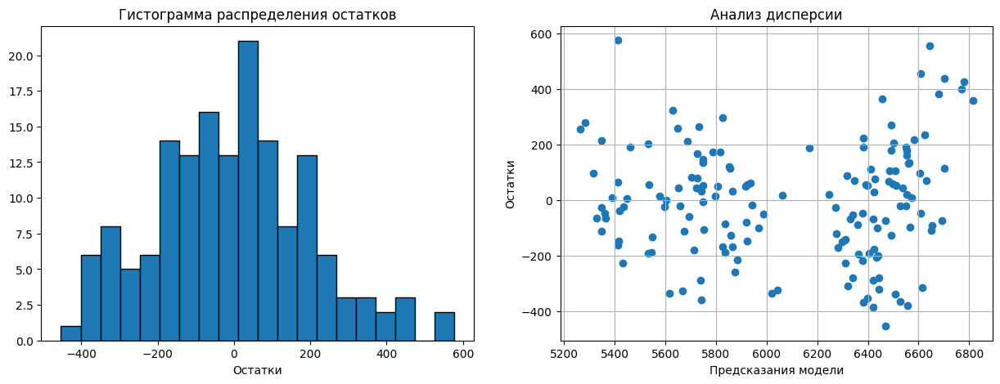

In [83]:
num_ft_lr2 = ['fodder_unit_sq', 'raw_protein']
cat_ft_lr2 = ['age', 'pasture_type', 'breed', 'spr_cat', 'dads_breed']

X_train, X_test, y_train, y_test, model_lr2, predictions_lr2 , scaler_lr2, encoder_lr2 = lr_model_fitting(df, num_ft_lr2, cat_ft_lr2)

mae = mean_absolute_error(y_test, predictions_lr2)
r2 = r2_score(y_test, predictions_lr2)  

print(f'MAE = {mae:.0f}')
print(f'R2 = {r2:.3f}')

residuals_graph(y_test, predictions_lr2)
print()

**Residual variance still increases with larger predictions, but R2 improved - new features helped, but same issues as LR1 remain.**

**Second linear regression model summary:**

* R2: 0.828 - better than first.
* Residuals show a "megaphone" - larger errors at higher values.
* New features added: fodder_unit squared and SPR as a category at 0.9.

<!-- removed colored markdown -->

### Third model: LR3

**In the third model, include the father's name; datasets were merged by id.**

MAE = 149
R2 = 0.852


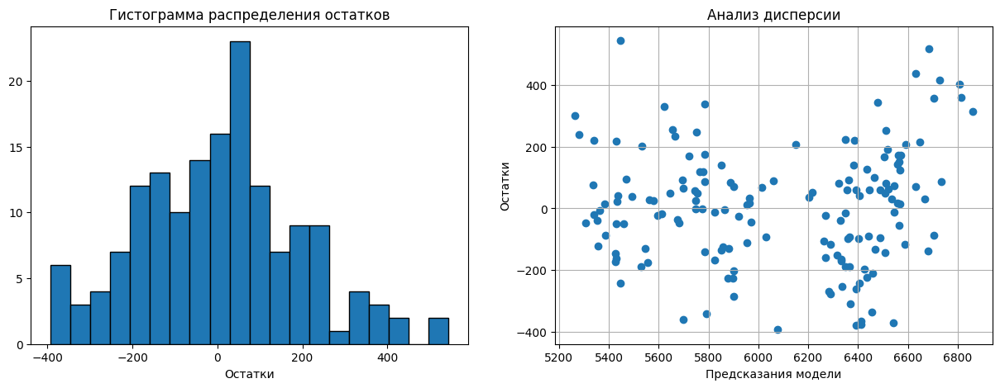

In [84]:
num_ft_lr3 = ['fodder_unit_sq', 'raw_protein']
cat_ft_lr3 = ['age', 'pasture_type', 'breed', 'spr_cat', 'dads_name']

X_train, X_test, y_train, y_test, model_lr3, predictions_lr3,  scaler_lr3, encoder_lr3  = lr_model_fitting(df, num_ft_lr3, cat_ft_lr3)

mae = mean_absolute_error(y_test, predictions_lr3)
r2 = r2_score(y_test, predictions_lr3)  

print(f'MAE = {mae:.0f}')
print(f'R2 = {r2:.3f}')

residuals_graph(y_test, predictions_lr3)
print()

<!-- removed colored markdown -->

Removed the feature, model quality unchanged.

**R2 for the third model is even better - 0.852, residuals are more often negative - model overestimates more.**

**Third linear regression model summary:**

 * R2: 0.852 - best so far.
 * Model more often overestimates predictions.
 * New feature - dads_name - was useful, as seen in correlation analysis.

### Model comparison

**Compare residual distributions and R2 for all three models.**

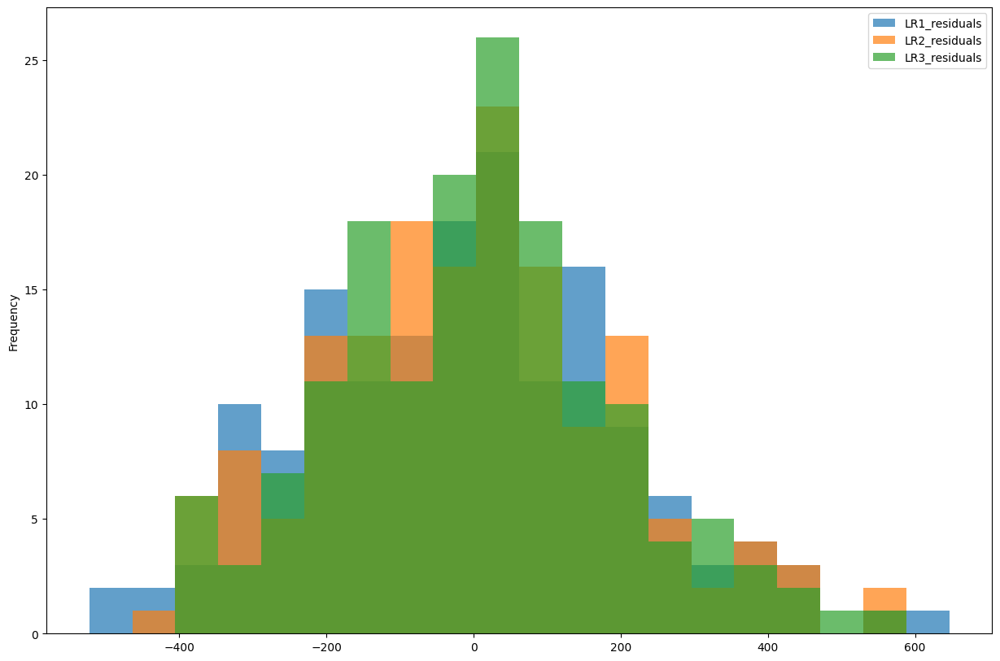

In [85]:
comparison_df = pd.DataFrame(np.array([predictions_lr1, predictions_lr2, predictions_lr3, y_test]).T
                              , columns=['LR1_pred', 'LR2_pred', 'LR3_pred', 'y_test'])
comparison_df['LR1_residuals'] = comparison_df['y_test'] - comparison_df['LR1_pred']
comparison_df['LR2_residuals'] = comparison_df['y_test'] - comparison_df['LR2_pred']
comparison_df['LR3_residuals'] = comparison_df['y_test'] - comparison_df['LR3_pred']

fig, ax = plt.subplots(figsize=(15,10))

comparison_df[['LR1_residuals', 'LR2_residuals', 'LR3_residuals']].plot(kind='hist', bins=20, ax=ax, alpha=0.7, histtype='stepfilled')

plt.show()

**Third model (green) has fewer peaks.**

In [86]:
for pred in ['LR1_pred', 'LR2_pred', 'LR3_pred']:
    r2 = r2_score(y_test, comparison_df[pred])
    print(f'R2 метрика модели {comparison_df[pred].name[:-5]} = {r2:.3f}')

R2 метрика модели LR1 = 0.806
R2 метрика модели LR2 = 0.828
R2 метрика модели LR3 = 0.852


**Third model has the best R2.**

**Now calculate other metrics: MSE, MAE, RMSE.**

In [87]:
for pred in ['LR1_pred', 'LR2_pred', 'LR3_pred']:

    mae = mean_absolute_error(y_test, comparison_df[pred])
    mse = mean_squared_error(y_test, comparison_df[pred])
    rmse = np.sqrt(mean_squared_error(y_test, comparison_df[pred]))
    
    print(f'MAE метрика модели {comparison_df[pred].name[:-5]} = {mae:.3f}')
    print(f'MSE метрика модели {comparison_df[pred].name[:-5]} = {mse:.3f}')
    print(f'RMSE метрика модели {comparison_df[pred].name[:-5]} = {rmse:.3f}')
    print()
    print()

MAE метрика модели LR1 = 170.678
MSE метрика модели LR1 = 46423.323
RMSE метрика модели LR1 = 215.461


MAE метрика модели LR2 = 161.169
MSE метрика модели LR2 = 41172.955
RMSE метрика модели LR2 = 202.911


MAE метрика модели LR3 = 148.554
MSE метрика модели LR3 = 35533.437
RMSE метрика модели LR3 = 188.503



MSE метрика модели LR1 = 46423.323
RMSE метрика модели LR1 = 215.461


MAE метрика модели LR2 = 161.169
MSE метрика модели LR2 = 41172.955
RMSE метрика модели LR2 = 202.911


MAE метрика модели LR3 = 148.554
MSE метрика модели LR3 = 35533.437
RMSE метрика модели LR3 = 188.503




**Third model wins on all three metrics. Let's calculate the prediction confidence interval: 95% confidence for mean error, using mean and sample variance.**

In [88]:
err = comparison_df['LR3_residuals']
def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), st.sem(a)
    h = se * st.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h
mean_err, left, right = mean_confidence_interval(err)
print(f"""Доверительный интервал с уровнем доверия 95% среднего ошибки модели составляет: 
({left:.2f}; {right:.2f}) со средним значением ошибки {mean_err:.2f}""")

Доверительный интервал с уровнем доверия 95% среднего ошибки модели составляет: 
(-25.45; 34.16) со средним значением ошибки 4.36


In [89]:
errors = err
quantiles=(0.025, 0.975)

lower_quantile = np.quantile(errors, quantiles[0])
upper_quantile = np.quantile(errors, quantiles[1])

print(f"Доверительный интервал прогноза: [{lower_quantile:.2f}, {upper_quantile:.2f}]")

Доверительный интервал прогноза: [-365.31, 402.01]


<!-- removed colored markdown -->

Added percentile-based confidence interval; in recommendations, select cows with yield above 6000 + 400 (adjustment) liters.

<!-- removed colored markdown -->

### Yield prediction for df_buy

**Add missing features to df_buy: fodder_unit, spr, raw_protein. Use mean values from main dataset increased by 5%, add fodder_unit squared and spr_cat. Then scale and encode features.**

In [90]:
df_buy.head()

,breed,pasture_type,dads_breed,dads_name,fat_content,protein_content,age
0,Айдиал,холмистое,Айдиал,Геркулес,3.58,3.076,более_2_лет
1,Айдиал,равнинное,Соверинг,Буйный,3.54,3.081,менее_2_лет
2,Соверинг,равнинное,Соверинг,Барин,3.59,3.074,более_2_лет
3,Соверинг,холмистое,Айдиал,Буйный,3.40,3.061,более_2_лет
4,Соверинг,равнинное,Айдиал,Буйный,3.64,3.074,более_2_лет


In [91]:
df_buy['fodder_unit'] = df['fodder_unit'].mean() * 1.05
df_buy['spr'] = df['spr'].mean() * 1.05
df_buy['raw_protein'] = df['raw_protein'].mean() * 1.05
df_buy['fodder_unit_sq'] = df_buy['fodder_unit']**2
df_buy['spr_cat'] = df_buy['spr'] > 0.9

In [93]:
X_buy_ohe = encoder_lr3.transform(df_buy[cat_ft_lr3])
X_buy_num = scaler_lr3.transform(df_buy[num_ft_lr3])

encoder_col_names = encoder_lr3.get_feature_names_out()

X_buy_ohe = pd.DataFrame(X_buy_ohe, columns=encoder_col_names)
X_buy_scaled = pd.DataFrame(X_buy_num, columns=num_ft_lr3)

X_buy = pd.concat([X_buy_ohe, X_buy_scaled], axis=1)

predictions_yield = model_lr3.predict(X_buy)
print(f"""Из всех {len(predictions_yield)} коров учитывая доверительный интервал ошибки
подходят под критерий более 6000 килограмм удоя лишь {(predictions_yield >= 6000 + 402).sum()}.""")

Из всех 20 коров учитывая доверительный интервал ошибки
подходят под критерий более 6000 килограмм удоя лишь 10.


**Yield prediction for df_buy cows obtained; only half meet the >6000 kg yield criterion, considering the 95% confidence interval for overestimation.**

<!-- removed colored markdown -->

## Logistic regression model training

**For logistic regression, use milk_taste as the target. Before training, split data, scale, encode, etc. Replace milk_taste with '1' for tasty and '0' for not tasty.**

In [94]:
df.head()

,yield,fodder_unit,raw_protein,spr,breed,pasture_type,dads_breed,fat_content,protein_content,milk_taste,age,dads_name,spr_cat,fodder_unit_sq
0,5863,14.2,1743,0.890,Айдиал,равнинное,Айдиал,3.58,3.076,вкусно,более_2_лет,Буйный,False,201.64
1,5529,12.8,2138,0.890,Айдиал,равнинное,Соверинг,3.54,3.079,вкусно,менее_2_лет,Соловчик,False,163.84
2,5810,14.0,1854,0.885,Соверинг,холмистое,Соверинг,3.59,3.074,не вкусно,более_2_лет,Барин,False,196.00
3,5895,12.4,2012,0.885,Соверинг,холмистое,Айдиал,3.40,3.075,не вкусно,более_2_лет,Буйный,False,153.76
4,5302,12.8,1675,0.885,Айдиал,равнинное,Соверинг,3.73,3.073,вкусно,менее_2_лет,Барин,False,163.84


<Axes: >

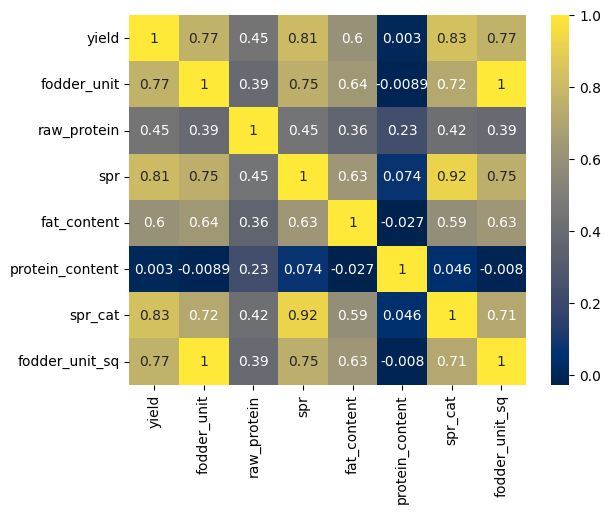

In [95]:
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='cividis') 

**No strong linear relationship between milk_taste and other features, so linear model may not be accurate.**

<!-- removed colored markdown -->

In [96]:
df.head()

,yield,fodder_unit,raw_protein,spr,breed,pasture_type,dads_breed,fat_content,protein_content,milk_taste,age,dads_name,spr_cat,fodder_unit_sq
0,5863,14.2,1743,0.890,Айдиал,равнинное,Айдиал,3.58,3.076,вкусно,более_2_лет,Буйный,False,201.64
1,5529,12.8,2138,0.890,Айдиал,равнинное,Соверинг,3.54,3.079,вкусно,менее_2_лет,Соловчик,False,163.84
2,5810,14.0,1854,0.885,Соверинг,холмистое,Соверинг,3.59,3.074,не вкусно,более_2_лет,Барин,False,196.00
3,5895,12.4,2012,0.885,Соверинг,холмистое,Айдиал,3.40,3.075,не вкусно,более_2_лет,Буйный,False,153.76
4,5302,12.8,1675,0.885,Айдиал,равнинное,Соверинг,3.73,3.073,вкусно,менее_2_лет,Барин,False,163.84


In [97]:
num_ft_logr = ['fodder_unit_sq', 'raw_protein']
cat_ft_logr = ['age', 'pasture_type', 'breed', 'spr_cat', 'dads_name']
df['milk_taste'] = df['milk_taste'].replace({'вкусно': 1, 'не вкусно': 0})
X_logistic = df.drop(columns=['milk_taste'])
y_logistic = df['milk_taste']

X_train, X_test, y_train, y_test = train_test_split(X_logistic, y_logistic, random_state=RANDOM_STATE)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train[num_ft_logr])
X_test_scaled = scaler.transform(X_test[num_ft_logr])

encoder = OneHotEncoder(drop='first', sparse_output=False)

X_train_ohe = encoder.fit_transform(X_train[cat_ft_logr])
X_test_ohe = encoder.transform(X_test[cat_ft_logr])
encoder_col_names = encoder.get_feature_names_out()
    
X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_ft_logr)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_ft_logr)

X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

C:\Users\datre\AppData\Local\Temp\ipykernel_15396\2747476994.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['milk_taste'] = df['milk_taste'].replace({'вкусно': 1, 'не вкусно': 0})


**Now train the logistic regression model.**

In [98]:
clf = LogisticRegression()
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:,1]
y_proba

array([0.58500172, 0.6422722 , 0.53116297, 0.36454936, 0.52116273,
       0.81936225, 0.68254415, 0.8053215 , 0.41697828, 0.58212616,
       0.64534998, 0.46615136, 0.62971049, 0.71075962, 0.39476971,
       0.49791604, 0.53900884, 0.34671412, 0.79116044, 0.62145125,
       0.5678869 , 0.53339055, 0.63336444, 0.37346346, 0.62686302,
       0.50109623, 0.70390907, 0.42326429, 0.52504672, 0.67491505,
       0.84337951, 0.80643707, 0.56752556, 0.74838103, 0.59905868,
       0.50794933, 0.37436445, 0.57041071, 0.50105412, 0.67406384,
       0.45783348, 0.27918972, 0.50013623, 0.65796087, 0.83774017,
       0.58686271, 0.35503959, 0.54637076, 0.82750324, 0.61613283,
       0.72449472, 0.56759975, 0.72209358, 0.46949877, 0.67977271,
       0.77875357, 0.86598551, 0.61064369, 0.71001288, 0.78681757,
       0.82695996, 0.75481277, 0.72593188, 0.3839089 , 0.47588018,
       0.65009713, 0.8370726 , 0.74106127, 0.41196877, 0.37970163,
       0.5822262 , 0.39688389, 0.46310061, 0.29765172, 0.40316

**Evaluate model quality on test set: accuracy, recall, precision.**

In [99]:
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

print('accuracy: ',round(accuracy,3))
print('recall: ',round(recall ,3))
print('precision: ',round(precision,3))

accuracy:  0.611
recall:  0.811
precision:  0.624


**Plot confusion matrix.**

Text(0.5, 25.722222222222214, 'Predicted')

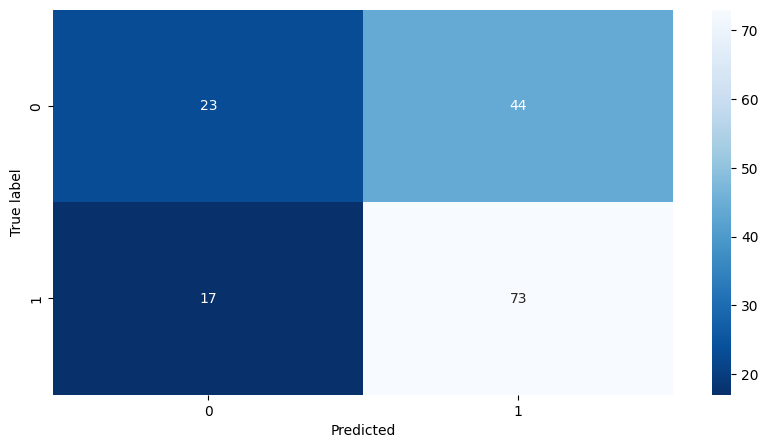

In [100]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r')
plt.ylabel('True label')
plt.xlabel('Predicted')

**Model often makes type I errors - predicts class 1 where it should be 0. This is critical, as the farmer wants only tasty milk. We need to maximize precision, so adjust the classification threshold to reduce type I errors.**

<!-- removed colored markdown -->

In [101]:
df_proba = pd.DataFrame(zip(y_test, y_proba),
             columns = ['y_valid', 'y_proba']).sort_values(by='y_proba',ascending=False)

print(df_proba.head()) 

     y_valid   y_proba
84         1  0.910007
92         1  0.878363
56         1  0.865986
81         1  0.845752
117        1  0.845204


In [102]:
thresholds = [round(i,2) for i in np.linspace(0.5,0.9,num = 25,endpoint=False)]
print(thresholds) 

[0.5, 0.52, 0.53, 0.55, 0.56, 0.58, 0.6, 0.61, 0.63, 0.64, 0.66, 0.68, 0.69, 0.71, 0.72, 0.74, 0.76, 0.77, 0.79, 0.8, 0.82, 0.84, 0.85, 0.87, 0.88]


In [103]:
for i in thresholds:
    df_proba['y_pred_'+str(i)] = df_proba['y_proba'].apply(lambda x: 1 if x >= i else 0)


for threshold in df_proba.columns[2:,]:
    recall = recall_score(df_proba['y_valid'], df_proba[threshold])
    precision = precision_score(df_proba['y_valid'], df_proba[threshold])
    accuracy = accuracy_score(df_proba['y_valid'], df_proba[threshold])

    #print(f'accuracy with threshold {threshold[7:]}: ',round(accuracy,3))
    #print(f'recall with threshold {threshold[7:]}: ',round(recall ,3))
    print(f'precision with threshold {threshold[7:]}: ',round(precision,3))
    print()

precision with threshold 0.5:  0.624

precision with threshold 0.52:  0.636

precision with threshold 0.53:  0.621

precision with threshold 0.55:  0.635

precision with threshold 0.56:  0.637

precision with threshold 0.58:  0.647

precision with threshold 0.6:  0.662

precision with threshold 0.61:  0.662

precision with threshold 0.63:  0.686

precision with threshold 0.64:  0.681

precision with threshold 0.66:  0.741

precision with threshold 0.68:  0.78

precision with threshold 0.69:  0.766

precision with threshold 0.71:  0.778

precision with threshold 0.72:  0.805

precision with threshold 0.74:  0.824

precision with threshold 0.76:  0.846

precision with threshold 0.77:  0.84

precision with threshold 0.79:  0.947

precision with threshold 0.8:  0.941

precision with threshold 0.82:  1.0

precision with threshold 0.84:  1.0

precision with threshold 0.85:  1.0

precision with threshold 0.87:  1.0

precision with threshold 0.88:  1.0



**At threshold 0.82, type I error is zero, but recall is very low - model rejects cows whose milk should be tasty.**

**Predict milk taste for df_buy. All features were already scaled and encoded in yield prediction with the third linear model.**

In [104]:
X_buy_ohe = encoder.transform(df_buy[cat_ft_logr])
X_buy_num = scaler.transform(df_buy[num_ft_logr])

encoder_col_names = encoder.get_feature_names_out()

X_buy_ohe = pd.DataFrame(X_buy_ohe, columns=encoder_col_names)
X_buy_scaled = pd.DataFrame(X_buy_num, columns=num_ft_lr3)

X_buy_logr = pd.concat([X_buy_ohe, X_buy_scaled], axis=1)

predictions_taste = clf.predict_proba(X_buy)[:,1]
predictions_taste

array([0.72303171, 0.64480297, 0.54008908, 0.68200579, 0.52449122,
       0.52347097, 0.72303171, 0.61003884, 0.54008908, 0.71336868,
       0.72088868, 0.48629251, 0.72303171, 0.78982845, 0.54008908,
       0.68200579, 0.72088868, 0.52347097, 0.61003884, 0.52449122])

**Add predicted yield and taste to df_buy.**

In [105]:
df_buy['proba_taste'] = predictions_taste
df_buy['pred_yield'] = predictions_yield
threshold = 0.82 
df_buy['pred_taste'] = df_buy['proba_taste'].apply(lambda x: 1 if x >= threshold else 0)
df_buy.head()

,breed,pasture_type,dads_breed,dads_name,fat_content,protein_content,age,fodder_unit,spr,raw_protein,fodder_unit_sq,spr_cat,proba_taste,pred_yield,pred_taste
0,Айдиал,холмистое,Айдиал,Геркулес,3.58,3.076,более_2_лет,15.276162,0.958744,2019.947532,233.361138,True,0.723032,6561.845309,0
1,Айдиал,равнинное,Соверинг,Буйный,3.54,3.081,менее_2_лет,15.276162,0.958744,2019.947532,233.361138,True,0.644803,6286.352996,0
2,Соверинг,равнинное,Соверинг,Барин,3.59,3.074,более_2_лет,15.276162,0.958744,2019.947532,233.361138,True,0.540089,6299.568422,0
3,Соверинг,холмистое,Айдиал,Буйный,3.40,3.061,более_2_лет,15.276162,0.958744,2019.947532,233.361138,True,0.682006,6606.439661,0
4,Соверинг,равнинное,Айдиал,Буйный,3.64,3.074,более_2_лет,15.276162,0.958744,2019.947532,233.361138,True,0.524491,6549.856147,0


In [106]:
df_buy[(df_buy['pred_yield'] >= 6000 + 402) & (df_buy['pred_taste'] == 1)]

,breed,pasture_type,dads_breed,dads_name,fat_content,protein_content,age,fodder_unit,spr,raw_protein,fodder_unit_sq,spr_cat,proba_taste,pred_yield,pred_taste


**With the chosen threshold, all cows are predicted to have not tasty milk, even with high yield.**

<!-- removed colored markdown -->

## Final conclusions

**No suitable cows for purchase were found by the linear and logistic regression models: the classification model is not accurate enough, more analysis and features affecting milk taste are needed. The model also makes more errors at high yields - the training set should be supplemented with more high-yield samples.**


<!-- removed colored markdown -->